### Testing keras tuner on whether dataset, source: https://www.tensorflow.org/tutorials/structured_data/time_series

## versión del LINK

In [2]:
import tensorflow as tf

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [3]:
zip_path = tf.keras.utils.get_file(
    origin='https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip',
    fname='jena_climate_2009_2016.csv.zip',
    extract=True)
csv_path, _ = os.path.splitext(zip_path)
df = pd.read_csv(csv_path)

In [4]:
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


In [4]:
def univariate_data(dataset, start_index, end_index, history_size, target_size):
  data = []
  labels = []

  start_index = start_index + history_size
  if end_index is None:
    end_index = len(dataset) - target_size

  for i in range(start_index, end_index):
    indices = range(i-history_size, i)
    # Reshape data from (history_size,) to (history_size, 1)
    data.append(np.reshape(dataset[indices], (history_size, 1)))
    labels.append(dataset[i+target_size])
  return np.array(data), np.array(labels)

In [5]:
TRAIN_SPLIT = 300000
tf.random.set_seed(13)

In [7]:
uni_data = df['T (degC)']
uni_data.index = df['Date Time']
uni_data.head()

Date Time
01.01.2009 00:10:00   -8.02
01.01.2009 00:20:00   -8.41
01.01.2009 00:30:00   -8.51
01.01.2009 00:40:00   -8.31
01.01.2009 00:50:00   -8.27
Name: T (degC), dtype: float64

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000002611868DD08>],
      dtype=object)

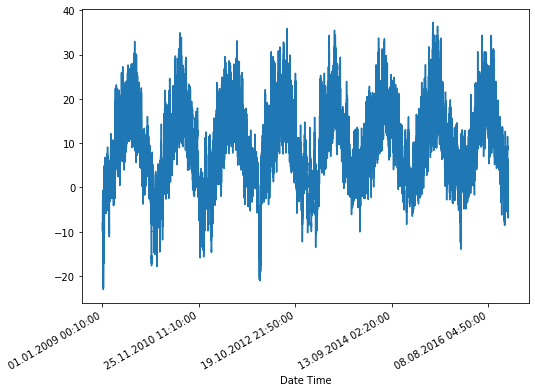

In [95]:
uni_data.plot(subplots=True)

In [8]:
# Standarizamos todos los valores con la media y std de los datos de train (como sería en caso real)
uni_data = uni_data.values

uni_train_mean = uni_data[:TRAIN_SPLIT].mean()
uni_train_std = uni_data[:TRAIN_SPLIT].std()
uni_data = (uni_data-uni_train_mean)/uni_train_std

In [97]:
data_to_pred = [0.60401906, 0.60054552, 0.60054552, 0.59938767, 0.59938766]
data_to_pred

[0.60401906, 0.60054552, 0.60054552, 0.59938767, 0.59938766]

########################################################

In [20]:
des_normalized_data = [(x*uni_train_std)+uni_train_mean for x in data_to_pred]
des_normalized_data

[14.450000036315924,
 14.420000042544466,
 14.420000042544466,
 14.410000015831578,
 14.409999929464373]

In [25]:
temps = df['T (degC)']
temps[14.450 in temps]

df[14.450000 in df['T (degC)'].values]
df[14.420000 in df['T (degC)'].values]
df[14.420000 in df['T (degC)'].values]
df[14.410000 in df['T (degC)'].values]
df[14.409999 in df['T (degC)'].values]

-8.02

In [30]:
df[df['T (degC)'].values==14.40]

i=0
def check_subsequent_values(values_to_check):
    for temp_value in values_to_check:
        

    return 

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
13802,06.04.2009 20:30:00,986.40,14.4,288.69,9.11,70.50,16.43,11.58,4.85,7.34,11.74,1189.66,0.41,1.75,229.10
20892,26.05.2009 02:10:00,986.43,14.4,288.69,11.00,80.00,16.43,13.14,3.29,8.33,13.32,1188.98,0.81,1.25,224.60
24372,19.06.2009 06:10:00,987.98,14.4,288.56,12.78,90.00,16.43,14.79,1.64,9.36,14.97,1190.10,0.59,1.25,228.70
25221,25.06.2009 03:40:00,987.95,14.4,288.56,11.93,85.10,16.43,13.98,2.45,8.85,14.15,1190.43,2.69,3.88,12.47
27416,10.07.2009 09:30:00,985.51,14.4,288.76,7.29,62.25,16.43,10.23,6.20,6.48,10.38,1189.20,5.58,8.13,210.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
405832,17.09.2016 16:50:00,985.71,14.4,288.75,13.40,93.70,16.43,15.39,1.04,9.77,15.62,1187.07,3.88,5.63,27.25
405841,17.09.2016 18:20:00,985.68,14.4,288.75,13.63,95.10,16.43,15.62,0.81,9.92,15.85,1186.93,1.73,3.60,20.63
405895,18.09.2016 03:20:00,986.56,14.4,288.68,13.00,91.30,16.43,15.00,1.43,9.51,15.20,1188.28,1.28,3.12,14.99
405903,18.09.2016 04:40:00,986.43,14.4,288.69,12.92,90.80,16.43,14.92,1.51,9.46,15.12,1188.16,3.45,4.97,22.64


########################################################


In [98]:
print('longitud de toda la serie: ', len(uni_data))
print('longitud de la seriede train: ', len(uni_data[:TRAIN_SPLIT]))

longitud de toda la serie:420551
longitud de la seriede train:300000


In [99]:
univariate_past_history = 20
univariate_future_target = 0

x_train_uni, y_train_uni = univariate_data(uni_data, 0, TRAIN_SPLIT,
                                           univariate_past_history,
                                           univariate_future_target)
x_val_uni, y_val_uni = univariate_data(uni_data, TRAIN_SPLIT, None,
                                       univariate_past_history,
                                       univariate_future_target)

In [100]:
print ('Single window of past history')
print (x_train_uni[0])
print ('\n Target temperature to predict')
print (y_train_uni[0])

Single window of past history
[[-1.99766294]
 [-2.04281897]
 [-2.05439744]
 [-2.0312405 ]
 [-2.02660912]
 [-2.00113649]
 [-1.95134907]
 [-1.95134907]
 [-1.98492663]
 [-2.04513467]
 [-2.08334362]
 [-2.09723778]
 [-2.09376424]
 [-2.09144854]
 [-2.07176515]
 [-2.07176515]
 [-2.07639653]
 [-2.08913285]
 [-2.09260639]
 [-2.10418486]]

 Target temperature to predict
-2.1041848598100876


In [9]:
def create_time_steps(length):
  return list(range(-length, 0))

def show_plot(plot_data, delta, title):
  labels = ['History', 'True Future', 'Model Prediction']
  marker = ['.-', 'rx', 'go']
  time_steps = create_time_steps(plot_data[0].shape[0])
  if delta:
    future = delta
  else:
    future = 0

  plt.title(title)
  for i, x in enumerate(plot_data):
    if i:
      plt.plot(future, plot_data[i], marker[i], markersize=10,
               label=labels[i])
    else:
      plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
  plt.legend()
  plt.xlim([time_steps[0], (future+5)*2])
  plt.xlabel('Time-Step')
  return plt

<module 'matplotlib.pyplot' from 'C:\\Users\\gcabreram\\AppData\\Local\\Continuum\\anaconda3\\envs\\tf_gpu_env\\lib\\site-packages\\matplotlib\\pyplot.py'>

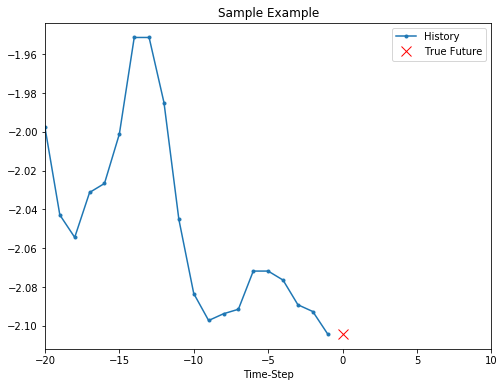

In [102]:
show_plot([x_train_uni[0], y_train_uni[0]], 0, 'Sample Example')

In [103]:
def baseline(history):
  return np.mean(history)

<module 'matplotlib.pyplot' from 'C:\\Users\\gcabreram\\AppData\\Local\\Continuum\\anaconda3\\envs\\tf_gpu_env\\lib\\site-packages\\matplotlib\\pyplot.py'>

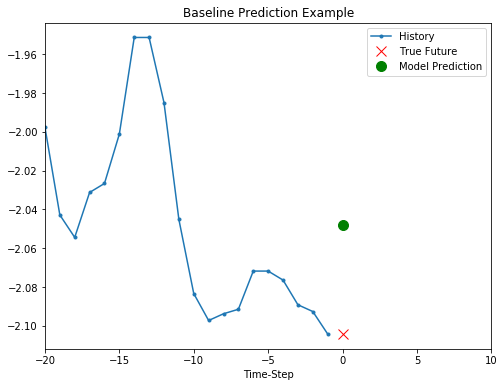

In [104]:
show_plot([x_train_uni[0], y_train_uni[0], baseline(x_train_uni[0])], 0,
           'Baseline Prediction Example')

In [105]:
BATCH_SIZE = 256
BUFFER_SIZE = 10000

train_univariate = tf.data.Dataset.from_tensor_slices((x_train_uni, y_train_uni))
train_univariate = train_univariate.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_univariate = tf.data.Dataset.from_tensor_slices((x_val_uni, y_val_uni))
val_univariate = val_univariate.batch(BATCH_SIZE).repeat()

In [106]:
x_train_uni.shape[-2:]

(20, 1)

In [49]:
simple_lstm_model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(8, input_shape=x_train_uni.shape[-2:]),
    tf.keras.layers.Dense(1)
])

simple_lstm_model.compile(optimizer='adam', loss='mae')

for x, y in val_univariate.take(1):
    print(simple_lstm_model.predict(x).shape)

(256, 1)


In [50]:
EVALUATION_INTERVAL = 200
EPOCHS = 10

simple_lstm_model.fit(train_univariate, epochs=EPOCHS,
                      steps_per_epoch=EVALUATION_INTERVAL,
                      validation_data=val_univariate, validation_steps=50)

Train for 200 steps, validate for 50 steps
Epoch 1/10
200/200 [==============================] - 2s 12ms/step - loss: 0.4075 - val_loss: 0.1351
Epoch 2/10
200/200 [==============================] - 1s 4ms/step - loss: 0.1118 - val_loss: 0.0360
Epoch 3/10
200/200 [==============================] - 1s 4ms/step - loss: 0.0490 - val_loss: 0.0289
Epoch 4/10
200/200 [==============================] - 1s 4ms/step - loss: 0.0444 - val_loss: 0.0257
Epoch 5/10
200/200 [==============================] - 1s 4ms/step - loss: 0.0299 - val_loss: 0.0235
Epoch 6/10
200/200 [==============================] - 1s 4ms/step - loss: 0.0317 - val_loss: 0.0224
Epoch 7/10
200/200 [==============================] - 1s 4ms/step - loss: 0.0287 - val_loss: 0.0207
Epoch 8/10
200/200 [==============================] - 1s 4ms/step - loss: 0.0263 - val_loss: 0.0195
Epoch 9/10
200/200 [==============================] - 1s 4ms/step - loss: 0.0253 - val_loss: 0.0182
Epoch 10/10
200/200 [==============================] - 1

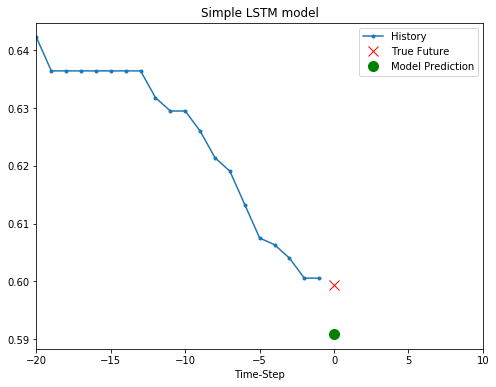

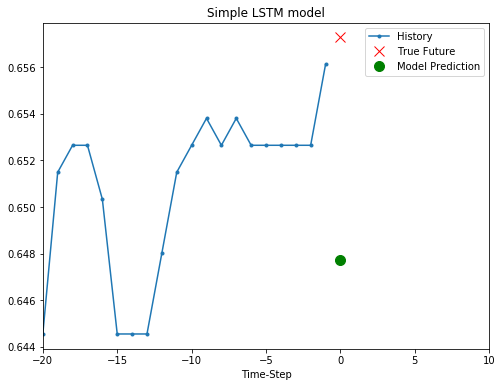

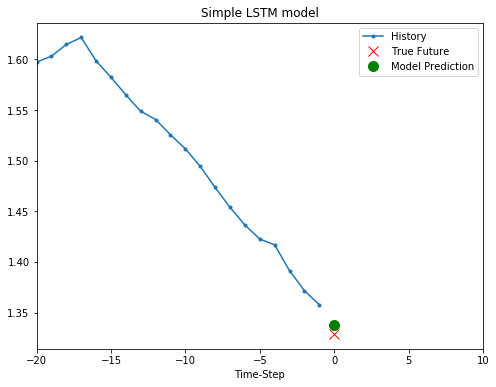

In [51]:
for x, y in val_univariate.take(3):
  plot = show_plot([x[0].numpy(), y[0].numpy(),
                    simple_lstm_model.predict(x)[0]], 0, 'Simple LSTM model')
  plot.show()

# Y ahora por mi cuenta calculo el mae en todo el validation set

In [54]:
import time

preds = []
true_values = []
init_time = time.time()
for x, y in val_univariate.take(300):
    true_values.append(y[0].numpy())
    preds.append(simple_lstm_model.predict(x)[0][0])

print('process time: ', time.time()-init_time)

process time:  9.060199499130249


In [57]:
# Y ahora por mi cuenta calculo el mae en todo el validation set:
tf_tutorial_model_mae = tf.keras.metrics.mae(true_values, preds).numpy()
tf_tutorial_model_mae

0.020209862

### Y ahora con hiperparam

In [68]:
from tensorflow import keras
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=4,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)


## (fuente: https://www.tensorflow.org/guide/keras/train_and_evaluate)
### * steps_per_epoch argument: specifies how many training steps the model should run using this Dataset before moving on to the next epoch  
### * if you want to run validation only on a specific number of batches from this Dataset, you can pass the validation_steps argument, which specifies how many validation steps the model should run with the validation Dataset before interrupting validation and moving on to the next epoch

In [69]:
EVALUATION_INTERVAL = 200
EPOCHS = 10

bayesian_opt_tuner.search(train_univariate, 
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,  
             steps_per_epoch=EVALUATION_INTERVAL  
             #batch_size=int(len(X_train)/2)
             #validation_split=0.2,verbose=1)
             )

1 21/200 [==>...........................] - ETA: 2s - loss: 0.0216 - mae: 0.021 25/200 [==>...........................] - ETA: 2s - loss: 0.0218 - mae: 0.021 29/200 [===>..........................] - ETA: 2s - loss: 0.0222 - mae: 0.022 33/200 [===>..........................] - ETA: 2s - loss: 0.0224 - mae: 0.022 37/200 [====>.........................] - ETA: 2s - loss: 0.0225 - mae: 0.022 41/200 [=====>........................] - ETA: 2s - loss: 0.0226 - mae: 0.022 45/200 [=====>........................] - ETA: 2s - loss: 0.0228 - mae: 0.022 49/200 [======>.......................] - ETA: 2s - loss: 0.0229 - mae: 0.022 53/200 [======>.......................] - ETA: 1s - loss: 0.0230 - mae: 0.023 57/200 [=======>......................] - ETA: 1s - loss: 0.0231 - mae: 0.023 61/200 [========>.....................] - ETA: 1s - loss: 0.0234 - mae: 0.023 65/200 [========>.....................] - ETA: 1s - loss: 0.0234 - mae: 0.023 69/200 [=========>....................] - ETA: 1s - loss: 0.02

9  9/200 [>.............................] - ETA: 2s - loss: 0.0182 - mae: 0.018 13/200 [>.............................] - ETA: 2s - loss: 0.0179 - mae: 0.017 17/200 [=>............................] - ETA: 2s - loss: 0.0174 - mae: 0.017 21/200 [==>...........................] - ETA: 2s - loss: 0.0172 - mae: 0.017 25/200 [==>...........................] - ETA: 2s - loss: 0.0175 - mae: 0.017 29/200 [===>..........................] - ETA: 2s - loss: 0.0175 - mae: 0.017 34/200 [====>.........................] - ETA: 2s - loss: 0.0175 - mae: 0.017 38/200 [====>.........................] - ETA: 2s - loss: 0.0178 - mae: 0.017 42/200 [=====>........................] - ETA: 2s - loss: 0.0177 - mae: 0.017 46/200 [=====>........................] - ETA: 2s - loss: 0.0177 - mae: 0.017 50/200 [======>.......................] - ETA: 2s - loss: 0.0181 - mae: 0.018 53/200 [======>.......................] - ETA: 2s - loss: 0.0182 - mae: 0.018 57/200 [=======>......................] - ETA: 2s - loss: 0.01

3 17/200 [=>............................] - ETA: 2s - loss: 0.0329 - mae: 0.032 21/200 [==>...........................] - ETA: 2s - loss: 0.0333 - mae: 0.033 25/200 [==>...........................] - ETA: 2s - loss: 0.0334 - mae: 0.033 29/200 [===>..........................] - ETA: 2s - loss: 0.0338 - mae: 0.033 33/200 [===>..........................] - ETA: 2s - loss: 0.0341 - mae: 0.034 37/200 [====>.........................] - ETA: 2s - loss: 0.0343 - mae: 0.034 41/200 [=====>........................] - ETA: 2s - loss: 0.0342 - mae: 0.034 45/200 [=====>........................] - ETA: 2s - loss: 0.0345 - mae: 0.034 49/200 [======>.......................] - ETA: 2s - loss: 0.0346 - mae: 0.034 53/200 [======>.......................] - ETA: 2s - loss: 0.0346 - mae: 0.034 57/200 [=======>......................] - ETA: 1s - loss: 0.0348 - mae: 0.034 61/200 [========>.....................] - ETA: 1s - loss: 0.0349 - mae: 0.034 65/200 [========>.....................] - ETA: 1s - loss: 0.03

4 17/200 [=>............................] - ETA: 2s - loss: 0.0144 - mae: 0.014 21/200 [==>...........................] - ETA: 2s - loss: 0.0142 - mae: 0.014 25/200 [==>...........................] - ETA: 2s - loss: 0.0140 - mae: 0.014 29/200 [===>..........................] - ETA: 2s - loss: 0.0141 - mae: 0.014 33/200 [===>..........................] - ETA: 2s - loss: 0.0142 - mae: 0.014 37/200 [====>.........................] - ETA: 2s - loss: 0.0142 - mae: 0.014 41/200 [=====>........................] - ETA: 2s - loss: 0.0143 - mae: 0.014 45/200 [=====>........................] - ETA: 2s - loss: 0.0144 - mae: 0.014 49/200 [======>.......................] - ETA: 2s - loss: 0.0144 - mae: 0.014 53/200 [======>.......................] - ETA: 2s - loss: 0.0146 - mae: 0.014 57/200 [=======>......................] - ETA: 2s - loss: 0.0148 - mae: 0.014 61/200 [========>.....................] - ETA: 1s - loss: 0.0150 - mae: 0.015 65/200 [========>.....................] - ETA: 1s - loss: 0.01

INFO:tensorflow:Oracle triggered exit


In [70]:
best_LSTM_model = bayesian_opt_tuner.get_best_models(num_models=1)[0]

In [72]:
import time

mis_preds = []
true_values = []
init_time = time.time()
for x, y in val_univariate.take(300):
    true_values.append(y[0].numpy())
    mis_preds.append(best_LSTM_model.predict(x)[0][0])

print('process time: ', time.time()-init_time)


process time:12.834720134735107


In [73]:
mi_best_LSTM_model_mae = keras.metrics.mae(true_values, mis_preds).numpy()
mi_best_LSTM_model_mae

0.015222953

In [74]:
for x, y in val_univariate.take(1):
    print(len(x))
    print(len(y))

256
256


In [75]:
for x, y in val_univariate.take(1):
    print(x[1].numpy())
    print(y[1].numpy())


[[0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63180738]
 [0.62949169]
 [0.62949169]
 [0.62601815]
 [0.62138676]
 [0.61907107]
 [0.61328183]
 [0.6074926 ]
 [0.60633475]
 [0.60401906]
 [0.60054552]
 [0.60054552]
 [0.59938767]]
0.5993876681669458


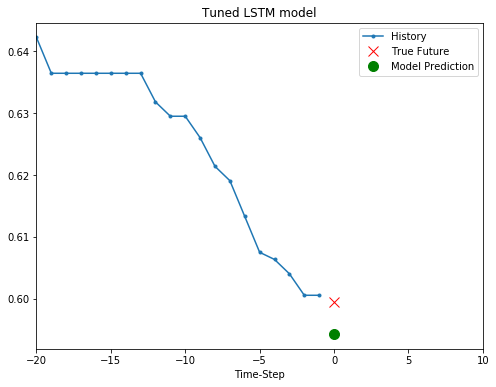

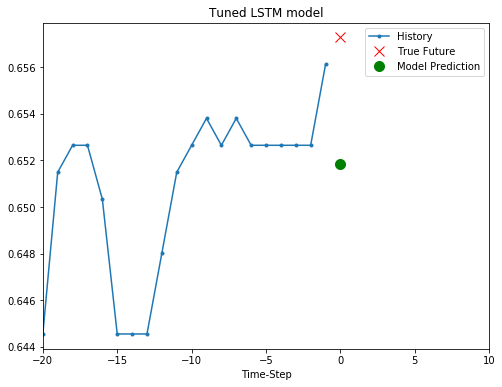

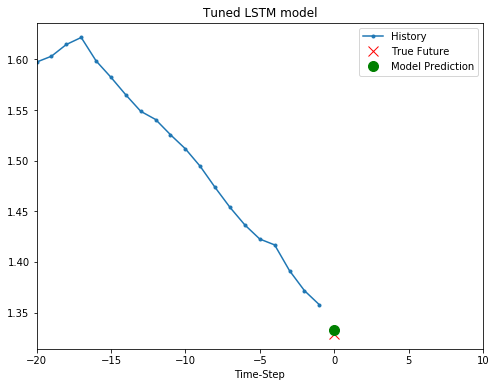

In [178]:
for x, y in val_univariate.take(3):
  plot = show_plot([x[0].numpy(), y[0].numpy(),
                    best_LSTM_model.predict(x)[0]], 0, 'Tuned LSTM model')
  plot.show()

## Forecast a multivariate time series

In [10]:
features_considered = ['p (mbar)', 'T (degC)', 'rho (g/m**3)']
features = df[features_considered]
features.index = df['Date Time']
features.head()

,p (mbar),T (degC),rho (g/m**3)
Date Time,,,
01.01.2009 00:10:00,996.52,-8.02,1307.75
01.01.2009 00:20:00,996.57,-8.41,1309.80
01.01.2009 00:30:00,996.53,-8.51,1310.24
01.01.2009 00:40:00,996.51,-8.31,1309.19
01.01.2009 00:50:00,996.51,-8.27,1309.00


array([<matplotlib.axes._subplots.AxesSubplot object at 0x000002AA936BA708>,
      dtype=object)

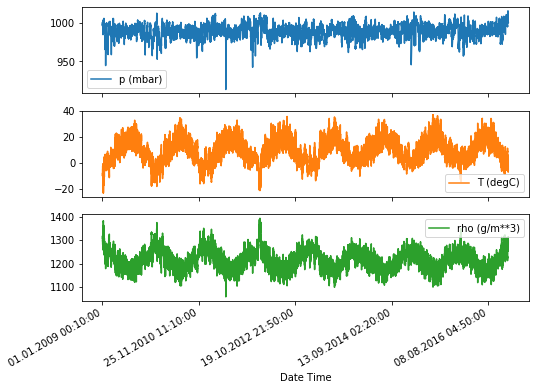

In [11]:
features.plot(subplots=True)

In [12]:
TRAIN_SPLIT = 300000
tf.random.set_seed(13)

In [13]:
dataset = features.values
data_mean = dataset[:TRAIN_SPLIT].mean(axis=0)
data_std = dataset[:TRAIN_SPLIT].std(axis=0)
dataset_standardized = (dataset-data_mean)/data_std

Single step model in a single step setup, the model learns to predict a single point in the future based on some history provided.

The below function performs the same windowing task as below, however, here it samples the past observation based on the step size given.

In [14]:
def multivariate_data(dataset, target, start_index, end_index, history_size,
                      target_size, step, single_step=False):
  data = []
  labels = []

  start_index = start_index + history_size
  if end_index is None:
    end_index = len(dataset) - target_size

  for i in range(start_index, end_index):
    indices = range(i-history_size, i, step)
    data.append(dataset[indices])

    if single_step:
      labels.append(target[i+target_size])
    else:
      labels.append(target[i:i+target_size])

  return np.array(data), np.array(labels)

In this tutorial, the network is shown data from the last five (5) days, i.e. 720 observations that are sampled every hour. The sampling is done every one hour since a drastic change is not expected within 60 minutes. Thus, 120 observation represent history of the last five days. For the single step prediction model, the label for a datapoint is the temperature 12 hours into the future. In order to create a label for this, the temperature after 72(i.e. 12*6) observations is used.

In [15]:
past_history = 720
future_target = 72
STEP = 6

x_train_single, y_train_single = multivariate_data(dataset, dataset[:, 1], 0,
                                                   TRAIN_SPLIT, past_history,
                                                   future_target, STEP,
                                                   single_step=True)
x_val_single, y_val_single = multivariate_data(dataset, dataset[:, 1],
                                               TRAIN_SPLIT, None, past_history,
                                               future_target, STEP,
                                               single_step=True)

### Mi check del split hecho por la función 'multivariate_data'

In [16]:
# esto serían los 3 últimos registros del históricos de 720 registros + 1 registro a futuro a predecir, del primer split hecho con 'multivariate_data'
dataset[past_history-3:past_history+1, :]

array([[ 997.5 ,  -12.43, 1331.79],
       [ 997.51,  -12.54, 1332.38],
       [ 997.6 ,  -12.63, 1332.96],
       [ 997.62,  -12.78, 1333.76]])

In [17]:
print('número de muestras utilizado en cada batch de histórico de 5 días: {}'.format(len(x_train_single[0])))
print('espero encontrarme, por cada batch en ''x_train_single'', 120 registros, correspondientes a un step=6')
print('2 primeros registros del x_train_single: {}'.format(x_train_single[0][:2]))

número de muestras utilizado en cada batch de histórico de 5 días: 120
espero encontrarme, por cada batch en x_train_single, 120 registros, correspondientes a un step=6
2 primeros registros del x_train_single: [[ 996.52   -8.02 1307.75]
 [ 996.5    -7.62 1305.68]]


In [12]:
print('comparado al registro de índice 0 y registro de índice 6 del dataset original: {}, {}'.format(dataset[0], dataset[6]))

comparado al registro de índice 0 y registro de índice 6 del dataset original: [ 996.52   -8.02 1307.75], [ 996.5    -7.62 1305.68]


In [13]:
print('espero encontrarme que cada valor en ''y_train_single'' se corresponde con el siguiente valor DE TEMPERATURA respecto al último de cada split de ''x_train_single'', en el original dataset')
print('primer registro del y_train_single: {}'.format(y_train_single[0]))
print('valor de temperatura del registro 720+72 del original dataset: {}'.format(dataset[792]))


espero encontrarme que cada valor en y_train_single se corresponde con el siguiente valor DE TEMPERATURA respecto al último de cada split de x_train_single, en el original dataset
primer registro del y_train_single: -14.46
valor de temperatura del registro 720+72 del original dataset: [ 997.73  -14.46 1342.7 ]


In [14]:
print('espero encontrarme que cada valor en ''y_train_single'' se corresponde con el siguiente valor DE TEMPERATURA respecto al último de cada split de ''x_train_single'', en el original dataset')
print('segundo registro del y_train_single: {}'.format(y_train_single[1]))
print('valor de temperatura del registro 720+1+72 del original dataset: {}'.format(dataset[793]))

print('espero encontrarme que cada valor en ''y_train_single'' se corresponde con el siguiente valor DE TEMPERATURA respecto al último de cada split de ''x_train_single'', en el original dataset')
print('segundo registro del y_train_single: {}'.format(y_train_single[2]))
print('valor de temperatura del registro 720+1+72 del original dataset: {}'.format(dataset[794]))

espero encontrarme que cada valor en y_train_single se corresponde con el siguiente valor DE TEMPERATURA respecto al último de cada split de x_train_single, en el original dataset
segundo registro del y_train_single: -14.08
valor de temperatura del registro 720+1+72 del original dataset: [ 997.6   -14.08 1340.54]
espero encontrarme que cada valor en y_train_single se corresponde con el siguiente valor DE TEMPERATURA respecto al último de cada split de x_train_single, en el original dataset
segundo registro del y_train_single: -13.56
valor de temperatura del registro 720+1+72 del original dataset: [ 997.46  -13.56 1337.65]


## OK split validado

In [18]:
# utilizamos los datos standarizados
past_history = 720
future_target = 72
STEP = 6

x_train_single, y_train_single = multivariate_data(dataset_standardized, dataset_standardized[:, 1], 0,
                                                   TRAIN_SPLIT, past_history,
                                                   future_target, STEP,
                                                   single_step=True)
x_val_single, y_val_single = multivariate_data(dataset_standardized, dataset_standardized[:, 1],
                                               TRAIN_SPLIT, None, past_history,
                                               future_target, STEP,
                                               single_step=True)

In [16]:
print ('Single window of past history : {}'.format(x_train_single[0].shape))

Single window of past history : (120, 3)


In [19]:
BUFFER_SIZE = 10000
BATCH_SIZE = 256

train_data_single = tf.data.Dataset.from_tensor_slices((x_train_single, y_train_single))
train_data_single = train_data_single.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_data_single = tf.data.Dataset.from_tensor_slices((x_val_single, y_val_single))
val_data_single = val_data_single.batch(BATCH_SIZE).repeat()

In [18]:
x_train_single.shape[-2:]

(120, 3)

In [20]:
single_step_model = tf.keras.models.Sequential()
single_step_model.add(tf.keras.layers.LSTM(32,
                                           input_shape=x_train_single.shape[-2:]))
single_step_model.add(tf.keras.layers.Dense(1))

single_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae')

In [20]:
for x, y in val_data_single.take(1):
  print(single_step_model.predict(x).shape)

(256, 1)


In [21]:
import time

mis_preds = []
true_values = []
init_time = time.time()
for x, y in val_data_single.take(300):
    true_values.append(y[0].numpy())
    mis_preds.append(single_step_model.predict(x)[0][0])

single_step_model_mae_b4_fit = tf.keras.metrics.mae(true_values, mis_preds).numpy()
print('single_step_model_mae_b4_fit: {}'.format(single_step_model_mae_b4_fit))

single_step_model_mae_b4_fit: 0.8571945428848267


In [21]:
EVALUATION_INTERVAL = 200
EPOCHS = 10

single_step_history = single_step_model.fit(train_data_single, epochs=EPOCHS,
                                            steps_per_epoch=EVALUATION_INTERVAL,
                                            validation_data=val_data_single,
                                            validation_steps=50)

Train for 200 steps, validate for 50 steps
Epoch 1/10
200/200 [==============================] - 7s 36ms/step - loss: 0.3251 - val_loss: 0.2670
Epoch 2/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2655 - val_loss: 0.2591
Epoch 3/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2617 - val_loss: 0.2519
Epoch 4/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2601 - val_loss: 0.2491
Epoch 5/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2284 - val_loss: 0.2408
Epoch 6/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2412 - val_loss: 0.2597
Epoch 7/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2442 - val_loss: 0.2566
Epoch 8/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2426 - val_loss: 0.2437
Epoch 9/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2469 - val_loss: 0.2444
Epoch 10/10
200/200 [===========================

In [22]:
import time

mis_preds = []
true_values = []
init_time = time.time()
for x, y in val_data_single.take(300):
    true_values.append(y[0].numpy())
    mis_preds.append(single_step_model.predict(x)[0][0])
    
single_step_model_mae_after_fit = tf.keras.metrics.mae(true_values, mis_preds).numpy()
print('single_step_model_mae_after_fit: {}'.format(single_step_model_mae_after_fit))

single_step_model_mae_after_fit: 0.2729339301586151


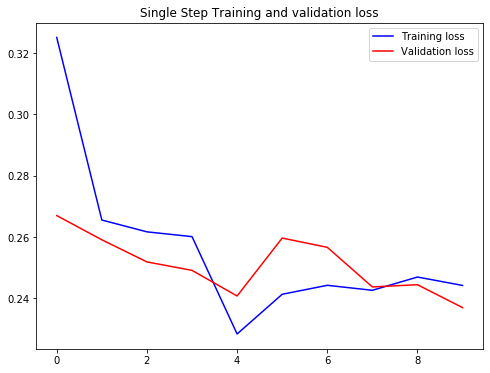

In [23]:
def plot_train_history(history, title):
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(loss))

  plt.figure()

  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title(title)
  plt.legend()

  plt.show()

plot_train_history(single_step_history, 'Single Step Training and validation loss')

### Predict a single step future: https://www.tensorflow.org/tutorials/structured_data/time_series#predict_a_single_step_future

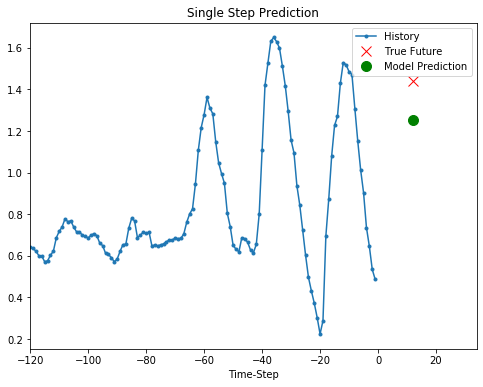

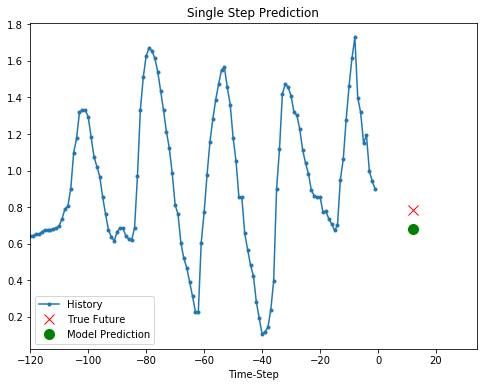

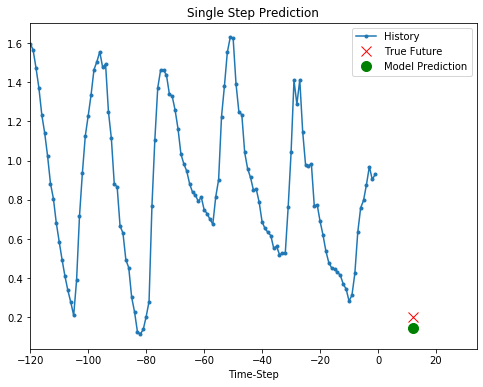

In [24]:
for x, y in val_data_single.take(3):
  plot = show_plot([x[0][:, 1].numpy(), y[0].numpy(),
                    single_step_model.predict(x)[0]], 12,
                   'Single Step Prediction')
  plot.show()

In [27]:
temps_mean = data_mean[1]
temps_std = data_std[1]


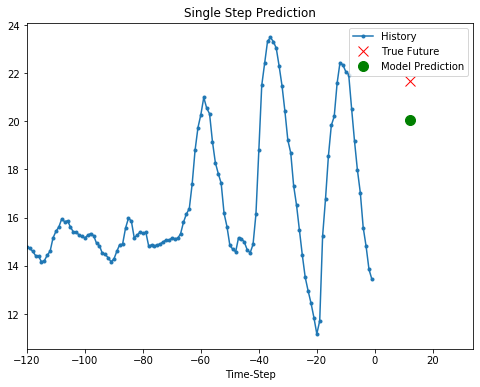

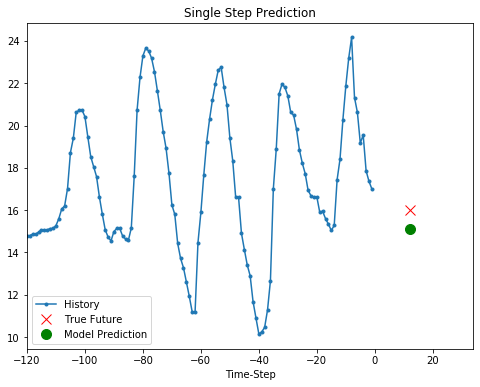

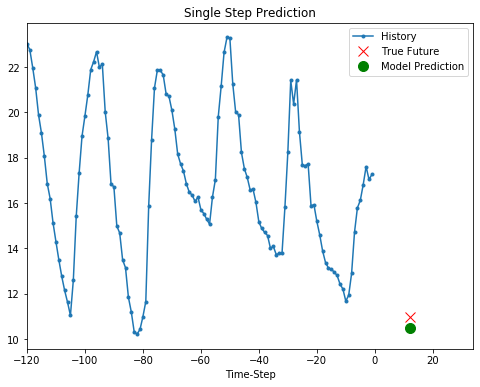

In [37]:
for x, y in val_data_single.take(3):
    x_denormalized = (x[0][:, 1].numpy())*temps_std+temps_mean
    y_denormalized = (y[0].numpy())*temps_std+temps_mean

    plot = show_plot([x_denormalized, y_denormalized,
                    (single_step_model.predict(x)[0])*temps_std+temps_mean], 12,
                   'Single Step Prediction')
    plot.show()

### Y ahora con hiperparametrización:

In [28]:
from tensorflow import keras
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_single.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=tf.keras.optimizers.RMSprop(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=6,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex_multivar',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 5
bayesian_opt_tuner.search(train_data_single, 
             epochs=EPOCHS,
             validation_data=val_data_single,
             validation_steps=50,  
             steps_per_epoch=EVALUATION_INTERVAL)

mae: 0.414146/200 [====================>.........] - ETA: 4s - loss: 0.4138 - mae: 0.413147/200 [=====================>........] - ETA: 4s - loss: 0.4137 - mae: 0.413148/200 [=====================>........] - ETA: 4s - loss: 0.4135 - mae: 0.413149/200 [=====================>........] - ETA: 4s - loss: 0.4130 - mae: 0.413150/200 [=====================>........] - ETA: 4s - loss: 0.4126 - mae: 0.412151/200 [=====================>........] - ETA: 4s - loss: 0.4121 - mae: 0.412152/200 [=====================>........] - ETA: 3s - loss: 0.4118 - mae: 0.411153/200 [=====================>........] - ETA: 3s - loss: 0.4115 - mae: 0.411154/200 [======================>.......] - ETA: 3s - loss: 0.4110 - mae: 0.411155/200 [======================>.......] - ETA: 3s - loss: 0.4105 - mae: 0.410156/200 [======================>.......] - ETA: 3s - loss: 0.4101 - mae: 0.410157/200 [======================>.......] - ETA: 3s - loss: 0.4095 - mae: 0.409158/200 [======================>.......] - ETA: 3s - l

 - mae: 2039.950150/200 [=====================>........] - ETA: 4s - loss: 2026.5734 - mae: 2026.573151/200 [=====================>........] - ETA: 4s - loss: 2013.2369 - mae: 2013.236152/200 [=====================>........] - ETA: 3s - loss: 2000.0317 - mae: 2000.031153/200 [=====================>........] - ETA: 3s - loss: 1988.8313 - mae: 1988.831154/200 [======================>.......] - ETA: 3s - loss: 1976.0661 - mae: 1976.065155/200 [======================>.......] - ETA: 3s - loss: 1963.8194 - mae: 1963.819156/200 [======================>.......] - ETA: 3s - loss: 1951.7366 - mae: 1951.736157/200 [======================>.......] - ETA: 3s - loss: 1940.1564 - mae: 1940.156158/200 [======================>.......] - ETA: 3s - loss: 1927.9569 - mae: 1927.956159/200 [======================>.......] - ETA: 3s - loss: 1915.8336 - mae: 1915.833160/200 [=======================>......] - ETA: 3s - loss: 1903.9747 - mae: 1903.974161/200 [=======================>......] - ETA: 3s - loss: 1

oss: 855205410931346992267264.0000 - mae: 855205322660794322649088.00 41/200 [=====>........................] - ETA: 12s - loss: 856518500254541521354752.0000 - mae: 856518428196947483426816.00 42/200 [=====>........................] - ETA: 12s - loss: 854875444710945721417728.0000 - mae: 854875370937694650630144.00 43/200 [=====>........................] - ETA: 12s - loss: 851872873433564274753536.0000 - mae: 851872803051728231464960.00 44/200 [=====>........................] - ETA: 12s - loss: 853499393513070757150720.0000 - mae: 853499287064352340836352.00 45/200 [=====>........................] - ETA: 12s - loss: 849321333318517807644672.0000 - mae: 849321243646845203251200.00 46/200 [=====>........................] - ETA: 11s - loss: 848273571657147404517376.0000 - mae: 848273526229533731061760.00 47/200 [======>.......................] - ETA: 11s - loss: 846569681490578579128320.0000 - mae: 846569652360912887087104.00 48/200 [======>.......................] - ETA: 11s - loss: 842

===============>.........] - ETA: 4s - loss: 10.7910 - mae: 10.791147/200 [=====================>........] - ETA: 4s - loss: 10.7204 - mae: 10.720148/200 [=====================>........] - ETA: 4s - loss: 10.6507 - mae: 10.650149/200 [=====================>........] - ETA: 4s - loss: 10.5814 - mae: 10.581150/200 [=====================>........] - ETA: 4s - loss: 10.5134 - mae: 10.513151/200 [=====================>........] - ETA: 4s - loss: 10.4461 - mae: 10.446152/200 [=====================>........] - ETA: 4s - loss: 10.3797 - mae: 10.379153/200 [=====================>........] - ETA: 4s - loss: 10.3143 - mae: 10.314154/200 [======================>.......] - ETA: 3s - loss: 10.2496 - mae: 10.249155/200 [======================>.......] - ETA: 3s - loss: 10.1857 - mae: 10.185156/200 [======================>.......] - ETA: 3s - loss: 10.1226 - mae: 10.122157/200 [======================>.......] - ETA: 3s - loss: 10.0603 - mae: 10.060158/200 [======================>.......] - ETA: 3s - l

s: 52389.7531 - mae: 52389.750165/200 [=======================>......] - ETA: 2s - loss: 52094.4237 - mae: 52094.418166/200 [=======================>......] - ETA: 2s - loss: 51780.6176 - mae: 51780.613167/200 [========================>.....] - ETA: 2s - loss: 51946.1838 - mae: 51946.179168/200 [========================>.....] - ETA: 2s - loss: 52153.9354 - mae: 52153.929169/200 [========================>.....] - ETA: 2s - loss: 52329.6731 - mae: 52329.668170/200 [========================>.....] - ETA: 2s - loss: 52022.8437 - mae: 52022.839171/200 [========================>.....] - ETA: 2s - loss: 51718.6186 - mae: 51718.613172/200 [========================>.....] - ETA: 2s - loss: 52017.0155 - mae: 52017.011173/200 [========================>.....] - ETA: 2s - loss: 52023.7961 - mae: 52023.793174/200 [=========================>....] - ETA: 2s - loss: 51724.8108 - mae: 51724.804175/200 [=========================>....] - ETA: 2s - loss: 51720.4717 - mae: 51720.460176/200 [===============

e: 153.250155/200 [======================>.......] - ETA: 3s - loss: 156.0764 - mae: 156.076156/200 [======================>.......] - ETA: 3s - loss: 157.5779 - mae: 157.578157/200 [======================>.......] - ETA: 3s - loss: 156.8198 - mae: 156.819158/200 [======================>.......] - ETA: 3s - loss: 158.4518 - mae: 158.451159/200 [======================>.......] - ETA: 3s - loss: 161.2374 - mae: 161.237160/200 [=======================>......] - ETA: 3s - loss: 160.9666 - mae: 160.966161/200 [=======================>......] - ETA: 3s - loss: 161.3124 - mae: 161.312162/200 [=======================>......] - ETA: 3s - loss: 161.3483 - mae: 161.348163/200 [=======================>......] - ETA: 3s - loss: 161.7427 - mae: 161.742164/200 [=======================>......] - ETA: 3s - loss: 161.9384 - mae: 161.938165/200 [=======================>......] - ETA: 2s - loss: 163.0658 - mae: 163.065166/200 [=======================>......] - ETA: 2s - loss: 164.1136 - mae: 164.113167/20

INFO:tensorflow:Oracle triggered exit


In [29]:
best_MULTIVAR_LSTM_model = bayesian_opt_tuner.get_best_models(num_models=1)[0]

import time

mis_preds = []
true_values = []
init_time = time.time()
for x, y in val_data_single.take(300):
    true_values.append(y[0].numpy())
    mis_preds.append(best_MULTIVAR_LSTM_model.predict(x)[0][0])

best_MULTIVAR_LSTM_model_mae_fit = keras.metrics.mae(true_values, mis_preds).numpy()
print('best_MULTIVAR_LSTM_model_mae_fit: {}'.format(best_MULTIVAR_LSTM_model_mae_fit))

best_MULTIVAR_LSTM_model_mae_fit: 0.29730454087257385


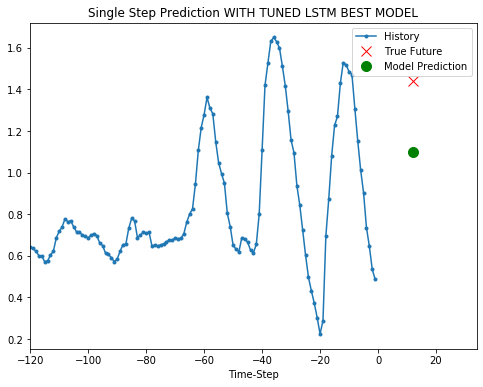

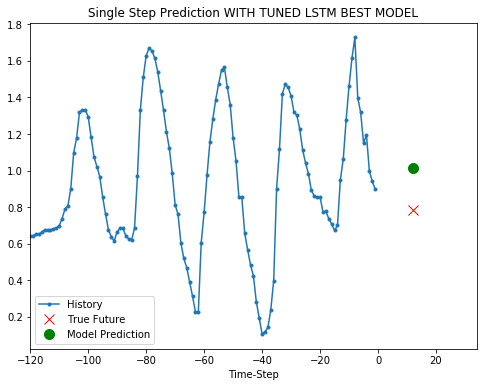

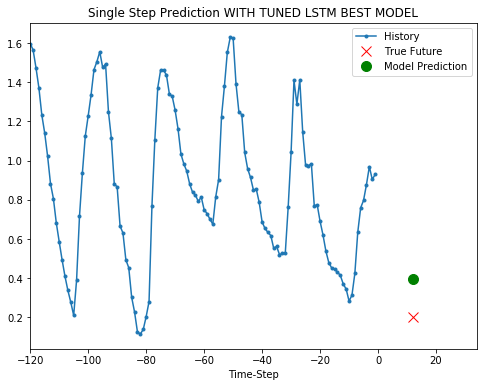

In [31]:
for x, y in val_data_single.take(3):
  plot = show_plot([x[0][:, 1].numpy(), y[0].numpy(),
                    best_MULTIVAR_LSTM_model.predict(x)[0]], 12,
                   'Single Step Prediction WITH TUNED LSTM BEST MODEL')
  plot.show()

## TO CHECK: https://www.tensorflow.org/tensorboard
## TO DO: dropout and other regularization methods + more layers...
## review: https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/RMSprop
## activar GPU y ver rendimiento, y si no se cuelga el hyperparam. process...

## Y ahora multi-step forecast: https://www.tensorflow.org/tutorials/structured_data/time_series#multi-step_model

In [38]:
past_history = 720
future_target = 72
STEP = 6

x_train_multi, y_train_multi = multivariate_data(dataset_standardized, dataset_standardized[:, 1], 0,
                                                 TRAIN_SPLIT, past_history,
                                                 future_target, STEP) #aquí el param. single_step=False
x_val_multi, y_val_multi = multivariate_data(dataset_standardized, dataset_standardized[:, 1],
                                             TRAIN_SPLIT, None, past_history,
                                             future_target, STEP) #aquí el param. single_step=False

In [39]:
print ('Single window of past history : {}'.format(x_train_multi[0].shape))
print ('\n Target temperature to predict : {}'.format(y_train_multi[0].shape))

Single window of past history : (120, 3)

 Target temperature to predict : (72,)


In [41]:
BATCH_SIZE = 256
BUFFER_SIZE = 10000

train_data_multi = tf.data.Dataset.from_tensor_slices((x_train_multi, y_train_multi))
train_data_multi = train_data_multi.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_data_multi = tf.data.Dataset.from_tensor_slices((x_val_multi, y_val_multi))
val_data_multi = val_data_multi.batch(BATCH_SIZE).repeat()

### Comprobamos lo que hace 'shuffle(BUFFER_SIZE) y batch(BATCH_SIZE)'

In [17]:
for x, y in train_data_multi.take(1):
    print(len(x))
    print(len(y))

256
256


In [18]:
for x, y in train_data_multi.take(2):
    print(x[0][-1])
    print(y[0][0])

tf.Tensor([ 1.84794887 -2.25354711  2.74916791], shape=(3,), dtype=float64)
tf.Tensor(-2.30449237473087, shape=(), dtype=float64)
tf.Tensor([-0.27699228 -1.18601226  1.06400387], shape=(3,), dtype=float64)
tf.Tensor(-1.270535086729375, shape=(), dtype=float64)


### Seguimos con el modelado

In [42]:
def create_time_steps(length):
  return list(range(-length, 0))

def multi_step_plot(history, true_future, prediction):
  plt.figure(figsize=(12, 6))
  num_in = create_time_steps(len(history))
  num_out = len(true_future)

  plt.plot(num_in, np.array(history[:, 1]), label='History')
  plt.plot(np.arange(num_out)/STEP, np.array(true_future), 'bo',
           label='True Future')
  if prediction.any():
    plt.plot(np.arange(num_out)/STEP, np.array(prediction), 'ro',
             label='Predicted Future')
  plt.legend(loc='upper left')
  plt.show()

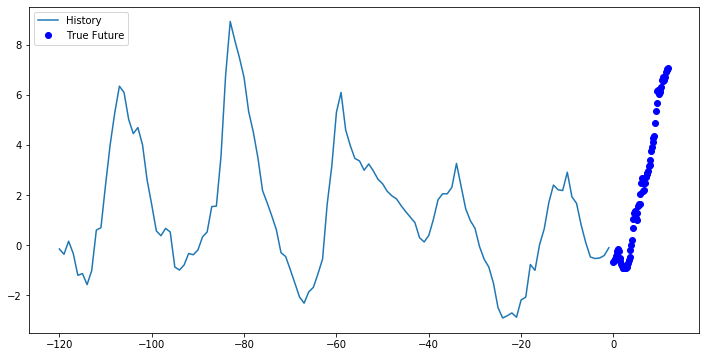

In [53]:
for x, y in train_data_multi.take(1):
  x_denormalized = (x[0])*temps_std+temps_mean
  y_denormalized = (y[0])*temps_std+temps_mean

  multi_step_plot(x_denormalized, y_denormalized, np.array([0]))


In [44]:
x_train_multi.shape[-2:]

(120, 3)

In [45]:
multi_step_model = tf.keras.models.Sequential()
multi_step_model.add(tf.keras.layers.LSTM(32,
                                          return_sequences=True,  # "Boolean. Whether to return the last output. in the output sequence, or the full sequence"
                                          input_shape=x_train_multi.shape[-2:]))
multi_step_model.add(tf.keras.layers.LSTM(16, activation='relu'))
multi_step_model.add(tf.keras.layers.Dense(72))

multi_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(clipvalue=1.0), loss='mae')


In [46]:
EVALUATION_INTERVAL = 200
EPOCHS = 10

multi_step_history = multi_step_model.fit(train_data_multi, epochs=EPOCHS,
                                          steps_per_epoch=EVALUATION_INTERVAL,
                                          validation_data=val_data_multi,
                                          validation_steps=50)

Train for 200 steps, validate for 50 steps
Epoch 1/10
200/200 [==============================] - 20s 101ms/step - loss: 0.5096 - val_loss: 0.2872
Epoch 2/10
200/200 [==============================] - 17s 87ms/step - loss: 0.3223 - val_loss: 0.2744
Epoch 3/10
200/200 [==============================] - 17s 86ms/step - loss: 0.2790 - val_loss: 0.2280
Epoch 4/10
200/200 [==============================] - 17s 87ms/step - loss: 0.2361 - val_loss: 0.2093
Epoch 5/10
200/200 [==============================] - 17s 87ms/step - loss: 0.1983 - val_loss: 0.2166
Epoch 6/10
200/200 [==============================] - 18s 88ms/step - loss: 0.2087 - val_loss: 0.2053
Epoch 7/10
200/200 [==============================] - 18s 89ms/step - loss: 0.2016 - val_loss: 0.2180
Epoch 8/10
200/200 [==============================] - 18s 88ms/step - loss: 0.1997 - val_loss: 0.1922
Epoch 9/10
200/200 [==============================] - 18s 88ms/step - loss: 0.2013 - val_loss: 0.1861
Epoch 10/10
200/200 [=================

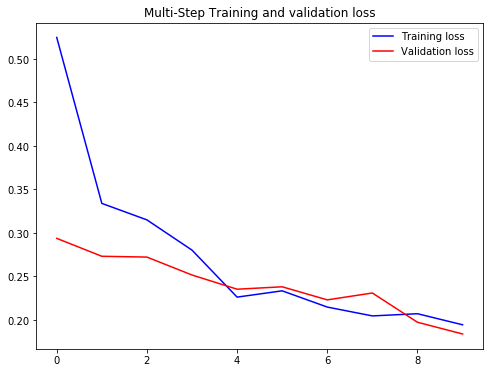

In [25]:
def plot_train_history(history, title):
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(loss))

  plt.figure()

  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title(title)
  plt.legend()

  plt.show()
  
plot_train_history(multi_step_history, 'Multi-Step Training and validation loss')

In [26]:
for x, y in val_data_multi.take(1):
    true_vals_1 = y[0].numpy()
    preds_1 = multi_step_model.predict(x)[0]

In [28]:
# de prueba, da mae = 5, tf.keras.metrics.mae([10, 4], [1, 3])
tf.keras.metrics.mae(true_vals_1, preds_1)

<tf.Tensor: shape=(), dtype=float32, numpy=0.21740071>

### Ahora ya calculamos el mae de 300 registros de prueba:

In [29]:
import time

mae_list = []
init_time = time.time()
for x, y in val_data_multi.take(300):
    mae_list.append(tf.keras.metrics.mae(y[0].numpy(), multi_step_model.predict(x)[0]).numpy())
    
print('total mae: {}'.format(np.mean(mae_list)))

total mae: 0.2057163119316101


### sin estandarizar, me dio un 'mae' = 7 y pico, standarizando el dataset da 0.2 :)

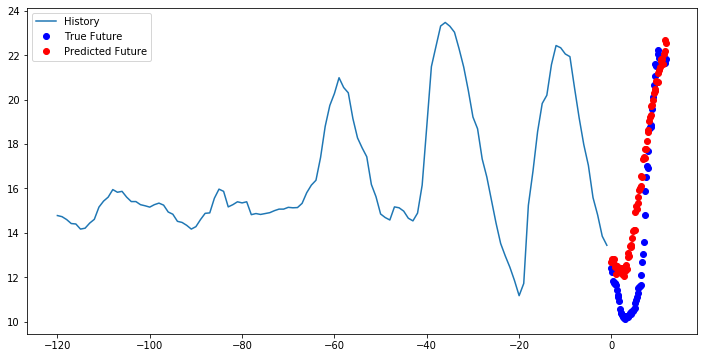

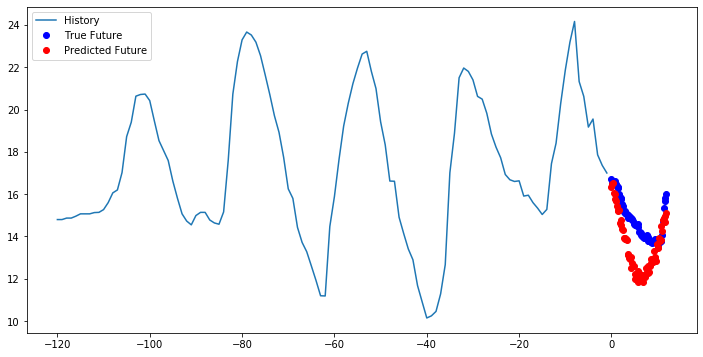

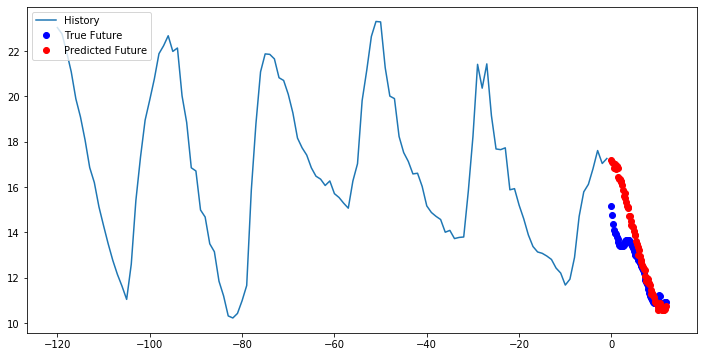

In [56]:

for x, y in val_data_multi.take(3):
    x_denormalized = (x[0])*temps_std+temps_mean
    y_denormalized = (y[0])*temps_std+temps_mean
    
    multi_step_plot(x_denormalized, y_denormalized, (multi_step_model.predict(x)[0])*temps_std+temps_mean)

### Y con bayesian tuning:

In [69]:
from tensorflow import keras
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                                        #activation='relu', 
                                        return_sequences=True, #ESTO NO LO APLICO ENTRE LA SIGUIENTE Y LA CAPA DE SALIDA, CHECK
                                        input_shape=x_train_multi.shape[-2:]))
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=16,
                                        max_value=56,
                                        step=8), 
                                        activation='relu'))
    model.add(keras.layers.Dense(72))

    model.compile(loss='mae', optimizer=tf.keras.optimizers.RMSprop(clipvalue=1.0,
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=4,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex_multivar_multistep',
    overwrite=True)

EVALUATION_INTERVAL = 100
EPOCHS = 10
bayesian_opt_tuner.search(train_data_multi, 
             epochs=EPOCHS,
             validation_data=val_data_multi,
             validation_steps=50,  
             steps_per_epoch=EVALUATION_INTERVAL)

s - loss: 1.0012 - mae: 1.001 47/100 [=============>................] - ETA: 4s - loss: 0.9877 - mae: 0.987 48/100 [=============>................] - ETA: 4s - loss: 0.9748 - mae: 0.974 49/100 [=============>................] - ETA: 4s - loss: 0.9621 - mae: 0.962 50/100 [==============>...............] - ETA: 4s - loss: 0.9500 - mae: 0.950 51/100 [==============>...............] - ETA: 4s - loss: 0.9382 - mae: 0.938 52/100 [==============>...............] - ETA: 4s - loss: 0.9268 - mae: 0.926 53/100 [==============>...............] - ETA: 4s - loss: 0.9157 - mae: 0.915 54/100 [===============>..............] - ETA: 4s - loss: 0.9046 - mae: 0.904 55/100 [===============>..............] - ETA: 4s - loss: 0.8943 - mae: 0.894 56/100 [===============>..............] - ETA: 3s - loss: 0.8846 - mae: 0.884 57/100 [================>.............] - ETA: 3s - loss: 0.8751 - mae: 0.875 58/100 [================>.............] - ETA: 3s - loss: 0.8656 - mae: 0.865 59/100 [================>.........

0573440.0000 - mae: 8096208870316674383872.000 37/100 [==========>...................] - ETA: 5s - loss: 8889658037198764638208.0000 - mae: 8889657556266435739648.000 38/100 [==========>...................] - ETA: 5s - loss: 9685961577850935967744.0000 - mae: 9685960398480043147264.000 39/100 [==========>...................] - ETA: 5s - loss: 9556247182293271052288.0000 - mae: 9556246596112611278848.000 40/100 [===========>..................] - ETA: 5s - loss: 9460957628259297656832.0000 - mae: 9460957183396892639232.000 41/100 [===========>..................] - ETA: 5s - loss: 9469671094092916850688.0000 - mae: 9469670522775947706368.000 42/100 [===========>..................] - ETA: 5s - loss: 9514441096314415480832.0000 - mae: 9514439680771730964480.000 43/100 [===========>..................] - ETA: 5s - loss: 9296759068505434750976.0000 - mae: 9296758755732731461632.000 44/100 [============>.................] - ETA: 5s - loss: 12544246704877040828416.0000 - mae: 1254424646318439373

INFO:tensorflow:Oracle triggered exit


In [102]:
bayesian_opt_tuner.results_summary()

In [96]:
best_MULTIVAR_MULTISTEP_LSTM_model.get_config()

{'name': 'sequential',
 'layers': [{'class_name': 'LSTM',
   'config': {'name': 'lstm',
    'trainable': True,
    'batch_input_shape': (None, 120, 3),
    'dtype': 'float32',
    'return_sequences': True,
    'return_state': False,
    'go_backwards': False,
    'stateful': False,
    'unroll': False,
    'time_major': False,
    'units': 16,
    'activation': 'tanh',
    'recurrent_activation': 'sigmoid',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'recurrent_initializer': {'class_name': 'Orthogonal',
     'config': {'gain': 1.0, 'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'unit_forget_bias': True,
    'kernel_regularizer': None,
    'recurrent_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'recurrent_constraint': None,
    'bias_constraint': None,
    'dropout': 0.0,
    'recurrent_dropout': 0.0,
    'i

## 
* Queda pendiente ver por qué aquí evalúa cada 1 training sample
* PLOTEAR TRAIN-VALIDATOIN LOSSES DEL BEST MODEL
* PROBAR BASELINE MODEL!!!

In [71]:
best_MULTIVAR_MULTISTEP_LSTM_model = bayesian_opt_tuner.get_best_models(num_models=1)[0]


### Save model

In [83]:
# serialize model to JSON
best_MULTIVAR_MULTISTEP_LSTM_model_json = best_MULTIVAR_MULTISTEP_LSTM_model.to_json()
with open("C:/keras_tuning/timeseries_temp_ts_test_from_TF_ex_multivar_multistep/best_MULTIVAR_MULTISTEP_LSTM_model.json", "w") as json_file:
    json_file.write(best_MULTIVAR_MULTISTEP_LSTM_model_json)
# serialize weights to HDF5
best_MULTIVAR_MULTISTEP_LSTM_model.save_weights("C:/keras_tuning/timeseries_temp_ts_test_from_TF_ex_multivar_multistep/best_MULTIVAR_MULTISTEP_LSTM_model.h5")
print("Saved model to disk")

Saved model to disk


Load model

In [84]:
from tensorflow.keras.models import model_from_json
# load json and create model
json_file = open('C:/keras_tuning/timeseries_temp_ts_test_from_TF_ex_multivar_multistep/best_MULTIVAR_MULTISTEP_LSTM_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()

loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("C:/keras_tuning/timeseries_temp_ts_test_from_TF_ex_multivar_multistep/best_MULTIVAR_MULTISTEP_LSTM_model.h5")
print("Loaded model from disk")


Loaded model from disk


In [85]:
loaded_model.get_config()

{'name': 'sequential',
 'layers': [{'class_name': 'LSTM',
   'config': {'name': 'lstm',
    'trainable': True,
    'batch_input_shape': (None, 120, 3),
    'dtype': 'float32',
    'return_sequences': True,
    'return_state': False,
    'go_backwards': False,
    'stateful': False,
    'unroll': False,
    'time_major': False,
    'units': 16,
    'activation': 'tanh',
    'recurrent_activation': 'sigmoid',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'recurrent_initializer': {'class_name': 'Orthogonal',
     'config': {'gain': 1.0, 'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'unit_forget_bias': True,
    'kernel_regularizer': None,
    'recurrent_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'recurrent_constraint': None,
    'bias_constraint': None,
    'dropout': 0.0,
    'recurrent_dropout': 0.0,
    'i

In [72]:
mae_list = []
init_time = time.time()
for x, y in val_data_multi.take(300):
    mae_list.append(tf.keras.metrics.mae(y[0].numpy(), best_MULTIVAR_MULTISTEP_LSTM_model.predict(x)[0]).numpy())
    
print('total mae: {}'.format(np.mean(mae_list)))

total mae: 0.3097887337207794


In [86]:
loaded_model_mae_list = []
init_time = time.time()
for x, y in val_data_multi.take(300):
    loaded_model_mae_list.append(tf.keras.metrics.mae(y[0].numpy(), loaded_model.predict(x)[0]).numpy())
    
print('total mae: {}'.format(np.mean(loaded_model_mae_list)))

total mae: 0.3097887337207794


In [57]:
# source: https://github.com/keras-team/keras-tuner/issues/41
# PENSAR EN MEJOR GUARDAR EL BEST MODEL CUANDO SE HACE EL TUNING PARA LUEGO CRGAR EL JSON & H5
'''
from kerastuner import BayesianOptimization
from tensorflow import keras 

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                                        activation='relu', 
                                        return_sequences=True, #ESTO NO LO APLICO ENTRE LA SIGUIENTE Y LA CAPA DE SALIDA, CHECK
                                        input_shape=x_train_multi.shape[-2:]))
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=16,
                                        max_value=56,
                                        step=8), 
                                        activation='relu'))
    model.add(keras.layers.Dense(72))

    model.compile(loss='mae', optimizer=tf.keras.optimizers.RMSprop(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

bayesian_opt_tuner_to_load_model = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=4,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex_multivar_multistep')

#bayesian_opt_tuner_to_load_model.reload()

#loaded_best_MULTIVAR_MULTISTEP_LSTM_model = bayesian_opt_tuner_to_load_model.get_best_models()[0]
'''

INFO:tensorflow:Reloading Oracle from existing project C:\keras_tuning\timeseries_temp_ts_test_from_TF_ex_multivar_multistep\oracle.json
INFO:tensorflow:Reloading Tuner from C:\keras_tuning\timeseries_temp_ts_test_from_TF_ex_multivar_multistep\tuner0.json


In [58]:
for x, y in val_data_multi.take(1):
    test_pred = loaded_best_MULTIVAR_MULTISTEP_LSTM_model.predict(x)[0]

test_pred

array([0.8710687 , 0.8508584 , 0.9137312 , 1.2414485 , 1.001883  ,
       0.10019425, 0.82961833, 0.78646916, 0.41817737, 0.91224444,
       0.95384043, 0.58787525, 0.89374816, 0.70730597, 0.3361829 ,
       0.9370077 , 0.84241676, 0.51444006, 0.8879885 , 0.5943588 ,
       0.84183156, 0.87696534, 0.8384236 , 0.6709833 , 1.0088091 ,
       0.50236917, 0.41849566, 0.93129486, 0.87259954, 0.92073965,
       0.74083656, 0.7185832 , 0.84519833, 0.7933818 , 0.8566148 ,
       0.8715916 , 0.8845276 , 0.81421447, 0.7827638 , 0.9314623 ,
       0.9378441 , 0.87143886, 0.3363183 , 0.92758393, 0.79604566,
       0.8190052 , 0.9334068 , 0.29527915, 1.035172  , 1.0304195 ,
       0.9587813 , 0.6912996 , 0.89228237, 0.93129253, 1.0925126 ,
       0.9104333 , 0.8794215 , 0.9145552 , 0.923078  , 0.94880664,
       0.8606547 , 0.9642229 , 0.9398473 , 0.5804521 , 0.29402918,
       0.9853502 , 0.9084404 , 0.7542708 , 0.40754703, 0.14232486,
       0.93832517, 0.83429164], dtype=float32)

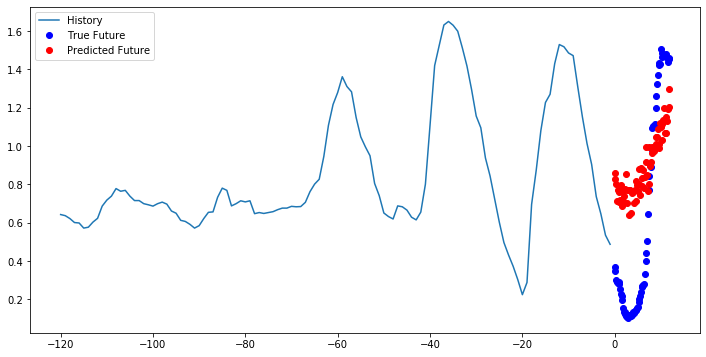

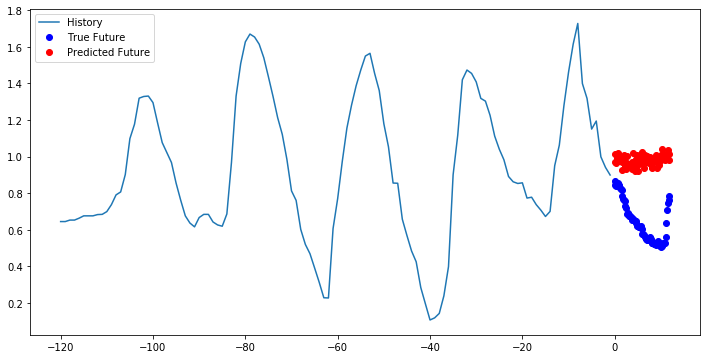

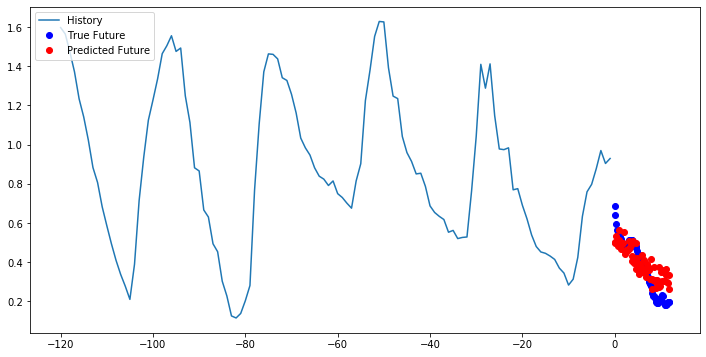

In [73]:

for x, y in val_data_multi.take(3):
    multi_step_plot(x[0], y[0], (best_MULTIVAR_MULTISTEP_LSTM_model.predict(x)[0]))

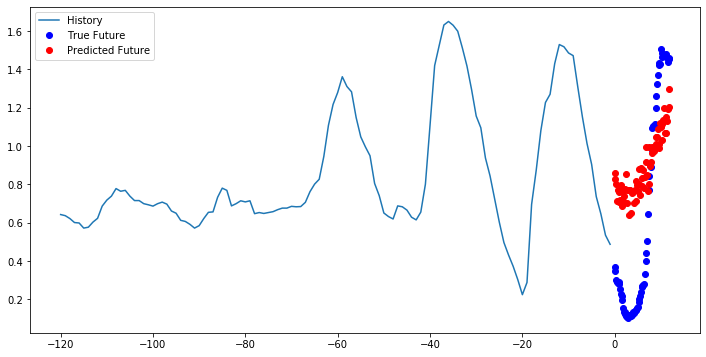

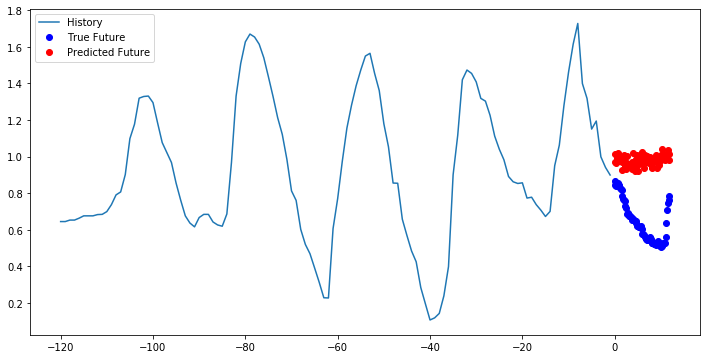

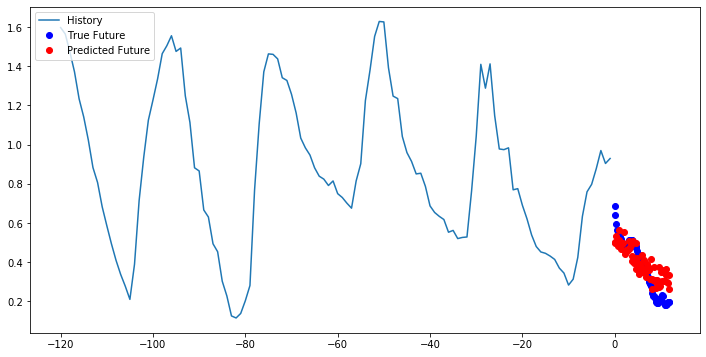

In [87]:

for x, y in val_data_multi.take(3):
    multi_step_plot(x[0], y[0], (loaded_model.predict(x)[0]))

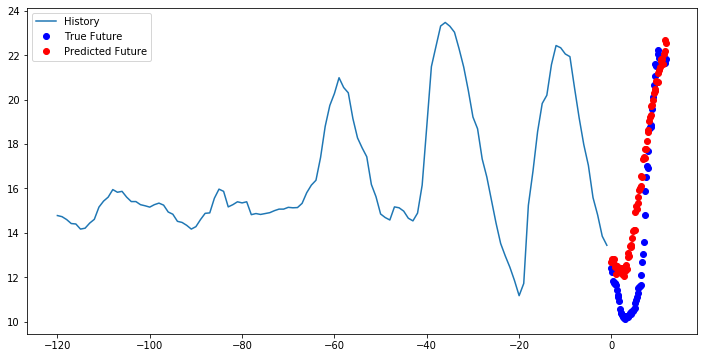

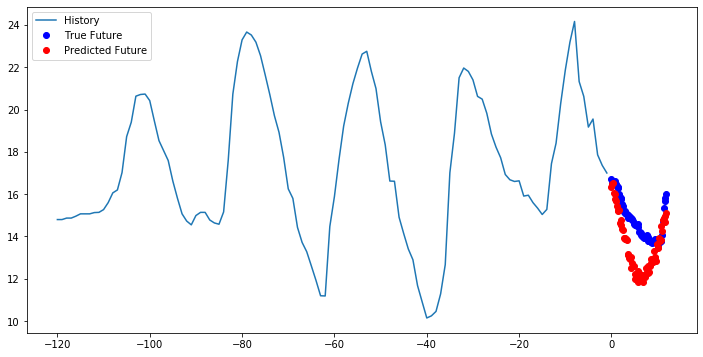

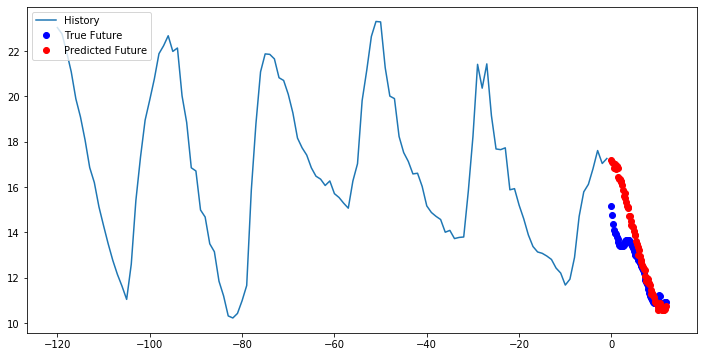

In [78]:

for x, y in val_data_multi.take(3):
    x_denormalized = (x[0])*temps_std+temps_mean
    y_denormalized = (y[0])*temps_std+temps_mean
    
    multi_step_plot(x_denormalized, y_denormalized, (multi_step_model.predict(x)[0])*temps_std+temps_mean)

### Y si cargo la misma config que el best_model de la hiperparam. y reentreno como se hizo con el del tutorial? En este caso cambio 32 por 16 units en la primera hidden layer (según me ha dado el best config), y lo demás igual

In [79]:
EVALUATION_INTERVAL = 200
EPOCHS = 10

best_config_step_model = tf.keras.models.Sequential()
best_config_step_model.add(tf.keras.layers.LSTM(16,
                                          return_sequences=True,  # "Boolean. Whether to return the last output. in the output sequence, or the full sequence"
                                          input_shape=x_train_multi.shape[-2:]))
best_config_step_model.add(tf.keras.layers.LSTM(16, activation='relu'))
best_config_step_model.add(tf.keras.layers.Dense(72))

best_config_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(clipvalue=1.0), loss='mae')
multi_step_history = best_config_step_model.fit(train_data_multi, epochs=EPOCHS,
                                          steps_per_epoch=EVALUATION_INTERVAL,
                                          validation_data=val_data_multi,
                                          validation_steps=50)

.....] - ETA: 9s - loss: 0.212 90/200 [============>.................] - ETA: 9s - loss: 0.212 91/200 [============>.................] - ETA: 9s - loss: 0.212 92/200 [============>.................] - ETA: 9s - loss: 0.212 93/200 [============>.................] - ETA: 9s - loss: 0.212 94/200 [=============>................] - ETA: 9s - loss: 0.212 95/200 [=============>................] - ETA: 9s - loss: 0.212 96/200 [=============>................] - ETA: 9s - loss: 0.212 97/200 [=============>................] - ETA: 9s - loss: 0.212 98/200 [=============>................] - ETA: 9s - loss: 0.212 99/200 [=============>................] - ETA: 8s - loss: 0.212100/200 [==============>...............] - ETA: 8s - loss: 0.212101/200 [==============>...............] - ETA: 8s - loss: 0.212102/200 [==============>...............] - ETA: 8s - loss: 0.212103/200 [==============>...............] - ETA: 8s - loss: 0.212104/200 [==============>...............] - ETA: 8s - loss: 0.212105/200 [=

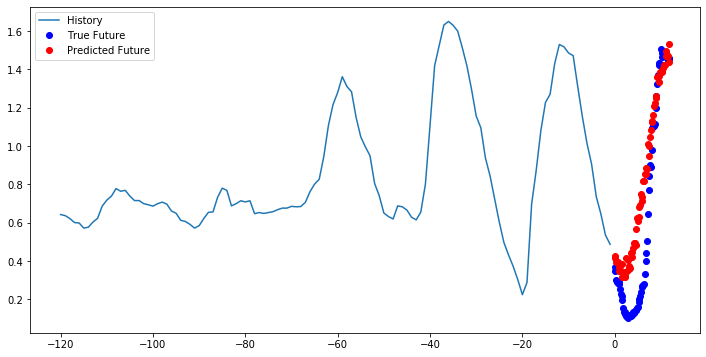

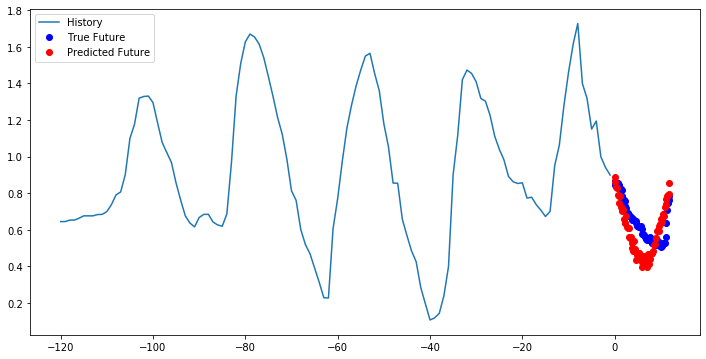

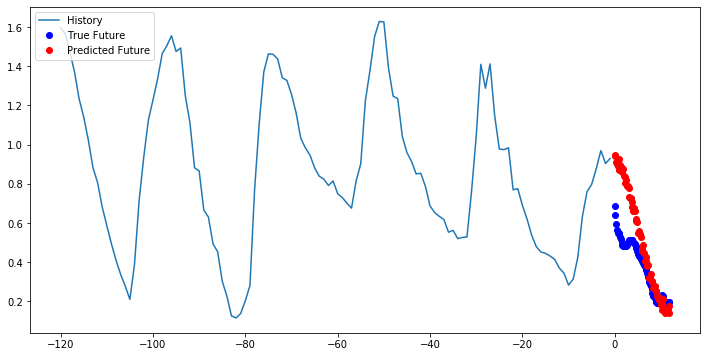

In [80]:

for x, y in val_data_multi.take(3):
    multi_step_plot(x[0], y[0], (best_MULTIVAR_MULTISTEP_LSTM_model.predict(x)[0]))

### Pues parece que por ahora tendré que reentrenar el modelo cogiendo la best_config aportada por la bayesian_tuning (ver cómo puedo mejorar esta vía sin tener que reentrenar)

In [82]:
mae_list = []
init_time = time.time()
for x, y in val_data_multi.take(300):
    mae_list.append(tf.keras.metrics.mae(y[0].numpy(), best_config_step_model.predict(x)[0]).numpy())
    
print('total mae: {}'.format(np.mean(mae_list)))

total mae: 0.2057930827140808


### 
* Al parecer también mejoro el 'mae'; probar a tunear sin incluir el learning rate como params space...

* Voy a probar bayesian tuner con exactamente la misma combinación:

In [104]:
from tensorflow import keras
from kerastuner import BayesianOptimization

def build_model_2(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=16,
                                        max_value=32,
                                        step=16), 
                                        #activation='relu', 
                                        return_sequences=True, #ESTO NO LO APLICO ENTRE LA SIGUIENTE Y LA CAPA DE SALIDA, CHECK
                                        input_shape=x_train_multi.shape[-2:]))
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=16,
                                        max_value=32,
                                        step=16),  
                                        activation='relu'))
    model.add(keras.layers.Dense(72))

    model.compile(loss='mae', optimizer=tf.keras.optimizers.RMSprop(clipvalue=1.0),
            
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner_2 = BayesianOptimization(
    build_model_2,
    objective='mae',
    max_trials=3,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex_multivar_multistep',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 10
bayesian_opt_tuner_2.search(train_data_multi, 
             epochs=EPOCHS,
             validation_data=val_data_multi,
             validation_steps=50,  
             steps_per_epoch=EVALUATION_INTERVAL)

e: 0.245146/200 [====================>.........] - ETA: 4s - loss: 0.2449 - mae: 0.244147/200 [=====================>........] - ETA: 4s - loss: 0.2447 - mae: 0.244148/200 [=====================>........] - ETA: 4s - loss: 0.2446 - mae: 0.244149/200 [=====================>........] - ETA: 4s - loss: 0.2444 - mae: 0.244150/200 [=====================>........] - ETA: 4s - loss: 0.2442 - mae: 0.244151/200 [=====================>........] - ETA: 4s - loss: 0.2440 - mae: 0.244152/200 [=====================>........] - ETA: 4s - loss: 0.2438 - mae: 0.243153/200 [=====================>........] - ETA: 4s - loss: 0.2437 - mae: 0.243154/200 [======================>.......] - ETA: 4s - loss: 0.2435 - mae: 0.243155/200 [======================>.......] - ETA: 4s - loss: 0.2434 - mae: 0.243156/200 [======================>.......] - ETA: 4s - loss: 0.2432 - mae: 0.243157/200 [======================>.......] - ETA: 3s - loss: 0.2431 - mae: 0.243158/200 [======================>.......] - ETA: 3s - los

: 0.218146/200 [====================>.........] - ETA: 5s - loss: 0.2182 - mae: 0.218147/200 [=====================>........] - ETA: 5s - loss: 0.2182 - mae: 0.218148/200 [=====================>........] - ETA: 4s - loss: 0.2182 - mae: 0.218149/200 [=====================>........] - ETA: 4s - loss: 0.2181 - mae: 0.218150/200 [=====================>........] - ETA: 4s - loss: 0.2180 - mae: 0.218151/200 [=====================>........] - ETA: 4s - loss: 0.2179 - mae: 0.217152/200 [=====================>........] - ETA: 4s - loss: 0.2178 - mae: 0.217153/200 [=====================>........] - ETA: 4s - loss: 0.2178 - mae: 0.217154/200 [======================>.......] - ETA: 4s - loss: 0.2178 - mae: 0.217155/200 [======================>.......] - ETA: 4s - loss: 0.2177 - mae: 0.217156/200 [======================>.......] - ETA: 4s - loss: 0.2175 - mae: 0.217157/200 [======================>.......] - ETA: 4s - loss: 0.2174 - mae: 0.217158/200 [======================>.......] - ETA: 4s - loss

 0.219146/200 [====================>.........] - ETA: 5s - loss: 0.2198 - mae: 0.219147/200 [=====================>........] - ETA: 5s - loss: 0.2197 - mae: 0.219148/200 [=====================>........] - ETA: 5s - loss: 0.2197 - mae: 0.219149/200 [=====================>........] - ETA: 5s - loss: 0.2196 - mae: 0.219150/200 [=====================>........] - ETA: 4s - loss: 0.2195 - mae: 0.219151/200 [=====================>........] - ETA: 4s - loss: 0.2195 - mae: 0.219152/200 [=====================>........] - ETA: 4s - loss: 0.2195 - mae: 0.219153/200 [=====================>........] - ETA: 4s - loss: 0.2193 - mae: 0.219154/200 [======================>.......] - ETA: 4s - loss: 0.2192 - mae: 0.219155/200 [======================>.......] - ETA: 4s - loss: 0.2191 - mae: 0.219156/200 [======================>.......] - ETA: 4s - loss: 0.2190 - mae: 0.219157/200 [======================>.......] - ETA: 4s - loss: 0.2188 - mae: 0.218158/200 [======================>.......] - ETA: 4s - loss:

INFO:tensorflow:Oracle triggered exit


In [105]:
best_MULTIVAR_MULTISTEP_LSTM_model_2 = bayesian_opt_tuner_2.get_best_models(num_models=1)[0]

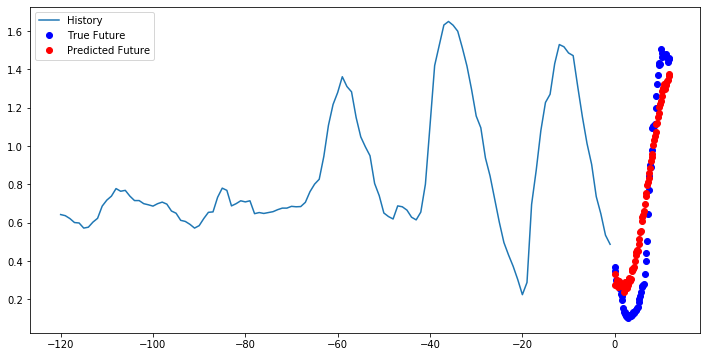

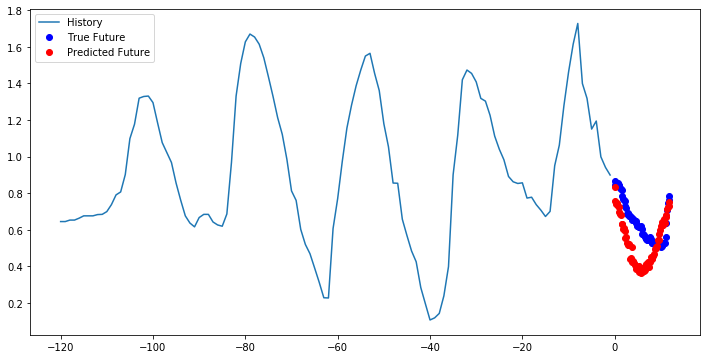

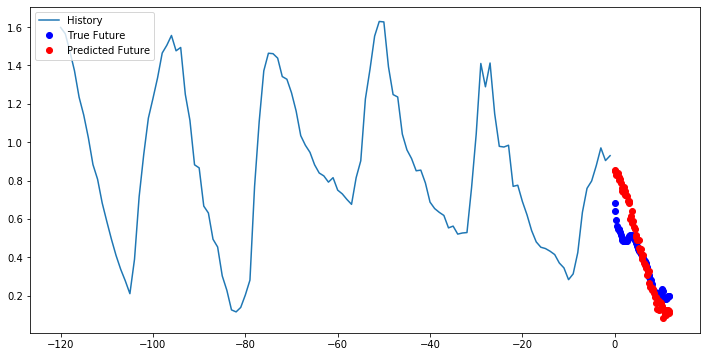

In [106]:
for x, y in val_data_multi.take(3):
    multi_step_plot(x[0], y[0], (best_MULTIVAR_MULTISTEP_LSTM_model_2.predict(x)[0]))

In [107]:
mae_list = []
init_time = time.time()
for x, y in val_data_multi.take(300):
    mae_list.append(tf.keras.metrics.mae(y[0].numpy(), best_MULTIVAR_MULTISTEP_LSTM_model_2.predict(x)[0]).numpy())
    
print('total mae: {}'.format(np.mean(mae_list)))

total mae: 0.22059817612171173


### Veo qeu el problema no era del bayesian tuner en sí (del cual he cogido el best model,y ha inferido bien con bajo mae), por lo que creo que será por barrer un mayor espacio de búsqueda de hiperparams (y ver lo del learning rate...)

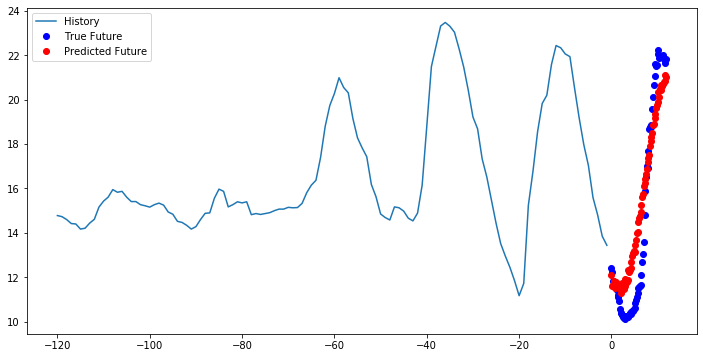

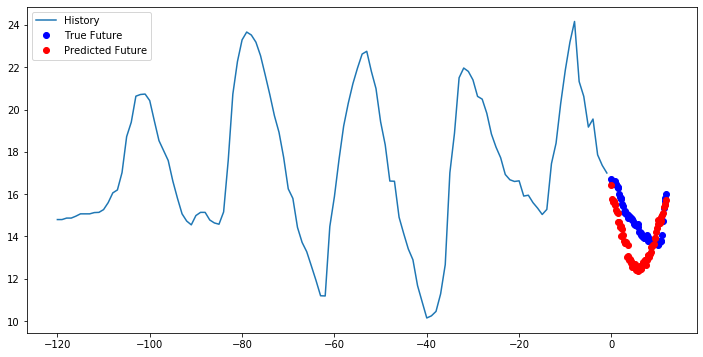

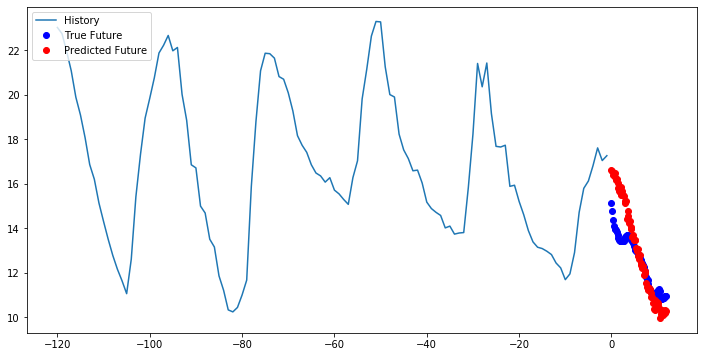

In [108]:
for x, y in val_data_multi.take(3):
    x_denormalized = (x[0])*temps_std+temps_mean
    y_denormalized = (y[0])*temps_std+temps_mean
    
    multi_step_plot(x_denormalized, y_denormalized, (best_MULTIVAR_MULTISTEP_LSTM_model_2.predict(x)[0])*temps_std+temps_mean)

### Y con dropout? source: https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout

In [75]:
tf.random.set_seed(0)
layer = tf.keras.layers.Dropout(.2, input_shape=(2,))
data = np.arange(10).reshape(5, 2).astype(np.float32)
print(data)

outputs = layer(data, training=True)
print(outputs)


[[0. 1.]
 [2. 3.]
 [4. 5.]
 [6. 7.]
 [8. 9.]]
tf.Tensor(
[[ 0.    1.25]
 [ 2.5   3.75]
 [ 5.    6.25]
 [ 7.5   8.75]
 [10.    0.  ]], shape=(5, 2), dtype=float32)


### Seguir revisando el fundamento de dropout

In [49]:
# AÑADO UN DROPOUT
from tensorflow import keras
from kerastuner import BayesianOptimization

def build_model_dropout(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                                        activation='relu', 
                                        return_sequences=True,
                                        input_shape=x_train_multi.shape[-2:]))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=16,
                                        max_value=56,
                                        step=8), 
                                        activation='relu'))
    model.add(keras.layers.Dense(72))

    model.compile(loss='mae', optimizer=tf.keras.optimizers.RMSprop(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner_con_dropout = BayesianOptimization(
    build_model_dropout,
    objective='mae',
    max_trials=4,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex_multivar_multistep_DROPOUT',
    overwrite=True)

EVALUATION_INTERVAL = 100
EPOCHS = 10
bayesian_opt_tuner_con_dropout.search(train_data_multi, 
             epochs=EPOCHS,
             validation_data=val_data_multi,
             validation_steps=50,  
             steps_per_epoch=EVALUATION_INTERVAL)

09288.000 54/100 [===============>..............] - ETA: 6s - loss: 6781340.6700 - mae: 6781338.000 55/100 [===============>..............] - ETA: 6s - loss: 6658043.5859 - mae: 6658041.000 56/100 [===============>..............] - ETA: 6s - loss: 6539150.2293 - mae: 6539147.500 57/100 [================>.............] - ETA: 6s - loss: 6424428.3307 - mae: 6424425.500 58/100 [================>.............] - ETA: 6s - loss: 6313662.4706 - mae: 6313659.500 59/100 [================>.............] - ETA: 6s - loss: 6206651.2787 - mae: 6206648.500 60/100 [=================>............] - ETA: 6s - loss: 6103207.1342 - mae: 6103204.500 61/100 [=================>............] - ETA: 5s - loss: 6003154.5693 - mae: 6003151.500 62/100 [=================>............] - ETA: 5s - loss: 5906329.5069 - mae: 5906326.500 63/100 [=================>............] - ETA: 5s - loss: 5812578.2559 - mae: 5812575.500 64/100 [==================>...........] - ETA: 5s - loss: 5721756.7417 - mae: 5721754.000 

- loss: 0.6724 - mae: 0.672 47/100 [=============>................] - ETA: 7s - loss: 0.6687 - mae: 0.668 48/100 [=============>................] - ETA: 7s - loss: 0.6649 - mae: 0.664 49/100 [=============>................] - ETA: 7s - loss: 0.6607 - mae: 0.660 50/100 [==============>...............] - ETA: 7s - loss: 0.6570 - mae: 0.657 51/100 [==============>...............] - ETA: 7s - loss: 0.6537 - mae: 0.653 52/100 [==============>...............] - ETA: 7s - loss: 0.6493 - mae: 0.649 53/100 [==============>...............] - ETA: 7s - loss: 0.6457 - mae: 0.645 54/100 [===============>..............] - ETA: 6s - loss: 0.6425 - mae: 0.642 55/100 [===============>..............] - ETA: 6s - loss: 0.6394 - mae: 0.639 56/100 [===============>..............] - ETA: 6s - loss: 0.6359 - mae: 0.635 57/100 [================>.............] - ETA: 6s - loss: 0.6324 - mae: 0.632 58/100 [================>.............] - ETA: 6s - loss: 0.6292 - mae: 0.629 59/100 [================>...........

- loss: 1.2396 - mae: 1.239 47/100 [=============>................] - ETA: 7s - loss: 1.2273 - mae: 1.227 48/100 [=============>................] - ETA: 7s - loss: 1.2200 - mae: 1.220 49/100 [=============>................] - ETA: 7s - loss: 1.2093 - mae: 1.209 50/100 [==============>...............] - ETA: 7s - loss: 1.1982 - mae: 1.198 51/100 [==============>...............] - ETA: 7s - loss: 1.1878 - mae: 1.187 52/100 [==============>...............] - ETA: 7s - loss: 1.1773 - mae: 1.177 53/100 [==============>...............] - ETA: 7s - loss: 1.1811 - mae: 1.181 54/100 [===============>..............] - ETA: 6s - loss: 1.1832 - mae: 1.183 55/100 [===============>..............] - ETA: 6s - loss: 1.1732 - mae: 1.173 56/100 [===============>..............] - ETA: 6s - loss: 1.1639 - mae: 1.163 57/100 [================>.............] - ETA: 6s - loss: 1.1557 - mae: 1.155 58/100 [================>.............] - ETA: 6s - loss: 1.1461 - mae: 1.146 59/100 [================>...........

- loss: 1.5867 - mae: 1.586 47/100 [=============>................] - ETA: 7s - loss: 1.5691 - mae: 1.569 48/100 [=============>................] - ETA: 7s - loss: 1.5578 - mae: 1.557 49/100 [=============>................] - ETA: 7s - loss: 1.5393 - mae: 1.539 50/100 [==============>...............] - ETA: 7s - loss: 1.5265 - mae: 1.526 51/100 [==============>...............] - ETA: 7s - loss: 1.5123 - mae: 1.512 52/100 [==============>...............] - ETA: 7s - loss: 1.4966 - mae: 1.496 53/100 [==============>...............] - ETA: 6s - loss: 1.4826 - mae: 1.482 54/100 [===============>..............] - ETA: 6s - loss: 1.4654 - mae: 1.465 55/100 [===============>..............] - ETA: 6s - loss: 1.4504 - mae: 1.450 56/100 [===============>..............] - ETA: 6s - loss: 1.4359 - mae: 1.435 57/100 [================>.............] - ETA: 6s - loss: 1.4227 - mae: 1.422 58/100 [================>.............] - ETA: 6s - loss: 1.4106 - mae: 1.410 59/100 [================>...........

INFO:tensorflow:Oracle triggered exit


In [50]:
bayesian_opt_tuner_con_dropout.results_summary()

In [51]:
best_MULTIVAR_MULTISTEP_LSTM_dropout_model = bayesian_opt_tuner_con_dropout.get_best_models(num_models=1)[0]

mae_dropout_list = []
for x, y in val_data_multi.take(300):
    mae_dropout_list.append(tf.keras.metrics.mae(y[0].numpy(), best_MULTIVAR_MULTISTEP_LSTM_dropout_model.predict(x)[0]).numpy())
    
print('total mae: {}'.format(np.mean(mae_dropout_list)))

total mae: 0.4662281274795532


## Guardar modelo! 

### Revisar

In [ ]:
best_MULTIVAR_MULTISTEP_dropout_LSTM_model = bayesian_opt_tuner.get_best_models(num_models=1)[0]


In [ ]:
import time

mae_dropout_list = []
init_time = time.time()
for x, y in val_data_multi.take(300):
    mae_dropout_list.append(tf.keras.metrics.mae(y[0].numpy(), best_MULTIVAR_MULTISTEP_dropout_LSTM_model.predict(x)[0]).numpy())
    
print('total mae: {}'.format(np.mean(mae_list)))

### Y con una layer más? 

In [70]:
from tensorflow import keras
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                                        activation='relu', 
                                        return_sequences=True,
                                        input_shape=x_train_multi.shape[-2:]))
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=16,
                                        max_value=56,
                                        step=8), 
                                        activation='relu',
                                        return_sequences=True,))
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=16,
                                        max_value=32,
                                        step=8), 
                                        activation='relu'))
    model.add(keras.layers.Dense(72))

    model.compile(loss='mae', optimizer=tf.keras.optimizers.RMSprop(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=4,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex_multivar_multistep',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 10
bayesian_opt_tuner.search(train_data_multi, 
             epochs=EPOCHS,
             validation_data=val_data_multi,
             validation_steps=50,  
             steps_per_epoch=EVALUATION_INTERVAL)

Train for 200 steps, validate for 50 steps
Epoch 1/10
  1/200 [..............................] - ETA: 9:30WARNING:tensorflow:Can save best model only with mae available, skipping.


InvalidArgumentError:  Incompatible shapes: [256,120,72] vs. [256,72]
	 [[node metrics/mae/sub (defined at C:\Users\gcabreram\AppData\Local\Continuum\anaconda3\envs\tf_gpu_env\lib\site-packages\kerastuner\engine\multi_execution_tuner.py:96) ]] [Op:__inference_distributed_function_179117]

Function call stack:
distributed_function


##########################################################################

## Ahora con el walk-forward que tenía de antes

In [6]:
def univariate_data(dataset, start_index, end_index, history_size, target_size):
  data = []
  labels = []

  start_index = start_index + history_size
  if end_index is None:
    end_index = len(dataset) - target_size

  for i in range(start_index, end_index):
    indices = range(i-history_size, i)
    # Reshape data from (history_size,) to (history_size, 1)
    data.append(np.reshape(dataset[indices], (history_size, 1)))
    labels.append(dataset[i+target_size])
  return np.array(data), np.array(labels)

In [7]:
import tensorflow

TRAIN_SPLIT = 300000

tensorflow.random.set_seed(13)

In [6]:
'''
uni_data = df['T (degC)']
uni_data.index = df['Date Time']
uni_data.head()
'''

"\nuni_data = df['T (degC)']\nuni_data.index = df['Date Time']\nuni_data.head()\n"

In [8]:
from datetime import datetime

df['Date Time'] = pd.to_datetime(df['Date Time'])
df.tail()

,Date Time,T (degC)
420546,2016-12-31 23:20:00,-4.05
420547,2016-12-31 23:30:00,-3.35
420548,2016-12-31 23:40:00,-3.16
420549,2016-12-31 23:50:00,-4.23
420550,2017-01-01 00:00:00,-4.82


In [8]:
df['Date Time'][:3]

0   2009-01-01 00:10:00
1   2009-01-01 00:20:00
2   2009-01-01 00:30:00
Name: Date Time, dtype: datetime64[ns]

In [9]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scatter(x=df['Date Time'], y=df['T (degC)']))
fig.show()

### Feature scaling

In [9]:
uni_data = df['T (degC)'].values
uni_train_mean = uni_data[:TRAIN_SPLIT].mean()
uni_train_std = uni_data[:TRAIN_SPLIT].std()

uni_data_scaled = (uni_data-uni_train_mean)/uni_train_std

In [10]:
df['T (degC)'] = uni_data_scaled
df['T (degC)']

0        -1.997663
1        -2.042819
2        -2.054397
3        -2.031241
4        -2.026609
            ...   
420546   -1.537998
420547   -1.456948
420548   -1.434949
420549   -1.558839
420550   -1.627152
Name: T (degC), Length: 420551, dtype: float64

In [11]:

def series_to_supervised(data, n_in, n_out=1):
    df = pd.DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = pd.concat(cols, axis=1)
    # drop rows with NaN values
    agg.dropna(inplace=True)
    
    return agg.values

supervised_T_values = series_to_supervised(df['T (degC)'], n_in=20, n_out=1)
supervised_T_values[0]

import numpy as np 

univariate_past_history = 20
univariate_future_target = 0

x_train_uni, y_train_uni = univariate_data(uni_data_scaled, 0, TRAIN_SPLIT,
                                           univariate_past_history,
                                           univariate_future_target)
x_val_uni, y_val_uni = univariate_data(uni_data_scaled, TRAIN_SPLIT, None,
                                       univariate_past_history,
                                       univariate_future_target)


In [12]:
supervised_T_values[:2]

array([[-1.99766294, -2.04281897, -2.05439744, -2.0312405 , -2.02660912,
        -2.00113649, -1.95134907, -1.95134907, -1.98492663, -2.04513467,
        -2.08334362, -2.09723778, -2.09376424, -2.09144854, -2.07176515,
        -2.07176515, -2.07639653, -2.08913285, -2.09260639, -2.10418486,
        -2.10418486],
       [-2.04281897, -2.05439744, -2.0312405 , -2.02660912, -2.00113649,
        -1.95134907, -1.95134907, -1.98492663, -2.04513467, -2.08334362,
        -2.09723778, -2.09376424, -2.09144854, -2.07176515, -2.07176515,
        -2.07639653, -2.08913285, -2.09260639, -2.10418486, -2.10418486,
        -2.09492208]])

In [12]:
print ('Single window of past history')
print (supervised_T_values[0][:-1])
print ('\n Target temperature to predict')
print (supervised_T_values[0][-1])

Single window of past history
[-1.99766294 -2.04281897 -2.05439744 -2.0312405  -2.02660912 -2.00113649
 -1.95134907 -1.95134907 -1.98492663 -2.04513467 -2.08334362 -2.09723778
 -2.09376424 -2.09144854 -2.07176515 -2.07176515 -2.07639653 -2.08913285
 -2.09260639 -2.10418486]

 Target temperature to predict
-2.1041848598100876


In [18]:
df.head(5)


,Date Time,T (degC)
0,2009-01-01 00:10:00,-1.997663
1,2009-01-01 00:20:00,-2.042819
2,2009-01-01 00:30:00,-2.054397
3,2009-01-01 00:40:00,-2.031241
4,2009-01-01 00:50:00,-2.026609


In [19]:
supervised_T_values[0][:5]

array([-1.99766294, -2.04281897, -2.05439744, -2.0312405 , -2.02660912])

In [14]:
df_one_pred = pd.DataFrame({'x': pd.Series(list(range(-20, 1, 1))), 'T_value': supervised_T_values[0]})

fig = px.line(df_one_pred, x='x', y='T_value')

fig.add_scatter(y=[df_one_pred.iloc[-1]['T_value']], mode="markers",
                marker=dict(size=10, color="MediumPurple"),
                name="ground_truth")

fig.show()


### Models definition

In [15]:
def baseline(history):
  return np.mean(history)

df_one_pred = pd.DataFrame({'x': pd.Series(list(range(-len(x_train_uni[0]), 1, 1))), 'T_value': supervised_T_values[0]})

fig = px.line(df_one_pred, x='x', y='T_value')
fig.add_scatter(y=[df_one_pred.iloc[-1]['T_value']], mode="markers",
                marker=dict(size=10, color="Green"),
                name="ground_truth")
fig.add_scatter(y=[baseline(x_train_uni[0])], mode="markers",
                marker=dict(size=10, color="Red"),
                name="prediction")

fig.show()

In [24]:
df_one_pred = pd.DataFrame({'x': pd.Series(list(range(-len(x_train_uni[0]), 1, 1))), 'T_value': x_train_uni[0]})

fig = px.line(df_one_pred, x='x', y='T_value')
fig.add_scatter(y=[df_one_pred.iloc[-1]['T_value']], mode="markers",
                marker=dict(size=10, color="Green"),
                name="ground_truth")
fig.add_scatter(y=[baseline(x_train_uni[0])], mode="markers",
                marker=dict(size=10, color="Red"),
                name="prediction")

fig.show()

Exception: Data must be 1-dimensional

## LSTM model

In [16]:
x_train_uni.shape[-2:]
len(x_train_uni)

299980

In [30]:
simple_lstm_model = keras.models.Sequential([
    keras.layers.LSTM(8, input_shape=x_train_uni.shape[-2:]),
    keras.layers.Dense(1)
])

simple_lstm_model.compile(optimizer='adam', loss='mae')

In [31]:
import tensorflow

BATCH_SIZE = 256
BUFFER_SIZE = 10000

train_univariate = tensorflow.data.Dataset.from_tensor_slices((x_train_uni, y_train_uni))
train_univariate = train_univariate.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_univariate = tensorflow.data.Dataset.from_tensor_slices((x_val_uni, y_val_uni))
val_univariate = val_univariate.batch(BATCH_SIZE).repeat()

In [32]:
for x, y in val_univariate.take(1):
    #print(simple_lstm_model.predict(x))
    print('x shape: ',x.shape)
    print('y shape: ',y.shape)

x shape:(256, 20, 1)
y shape:(256,)


## En principio son grupos de 256 registros donde cada uno supone 20 lags de temperatura (comparar esto a como lo haría yo con mi otra forma de Jason)

### Entiendo que con 'EVALUATION_INTERVAL' no es necesario indicar el BATCH_SIZE, ya que ya informa el número de muestras (steps) temporales a utilizar

In [33]:
EVALUATION_INTERVAL = 200  #https://datascience.stackexchange.com/questions/47405/what-to-set-in-steps-per-epoch-in-keras-fit-generator
EPOCHS = 4

simple_lstm_model.fit(train_univariate, epochs=EPOCHS,
                      steps_per_epoch=EVALUATION_INTERVAL,
                      validation_data=val_univariate, validation_steps=50)

Train for 200 steps, validate for 50 steps
Epoch 1/4
  1/200 [..............................] - ETA: 19:23

UnknownError:  [_Derived_]  Fail to find the dnn implementation.
	 [[{{node CudnnRNN}}]]
	 [[sequential/lstm/StatefulPartitionedCall]] [Op:__inference_distributed_function_2903]

Function call stack:
distributed_function -> distributed_function -> distributed_function


## En lo que sigue, dibujamos los 20 lags con los que se predicen junto con el valor 21 que es el true value VS predicho

In [42]:
print(x_val_uni[0]) #, 
print(y_val_uni[0])
print(x_val_uni[1]) #, 
print(y_val_uni[1])

[[0.642228  ]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63180738]
 [0.62949169]
 [0.62949169]
 [0.62601815]
 [0.62138676]
 [0.61907107]
 [0.61328183]
 [0.6074926 ]
 [0.60633475]
 [0.60401906]
 [0.60054552]
 [0.60054552]]
0.5993876681669458
[[0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63180738]
 [0.62949169]
 [0.62949169]
 [0.62601815]
 [0.62138676]
 [0.61907107]
 [0.61328183]
 [0.6074926 ]
 [0.60633475]
 [0.60401906]
 [0.60054552]
 [0.60054552]
 [0.59938767]]
0.5993876681669458


### Nota: con lo de arriba, veo que el primer 'y' se encuentra como último valor del siguiente x (time series format); esto parece no verse en los 'train_univariate' a los que se le hace shuffle, pero siguen estando de 20 en 20 con su correspondiente y (checkear esto) 


In [39]:
for x, y in val_univariate.take(3):
    print(x.numpy()[0])
    print(y.numpy()[0])

[[0.642228  ]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63643877]
 [0.63180738]
 [0.62949169]
 [0.62949169]
 [0.62601815]
 [0.62138676]
 [0.61907107]
 [0.61328183]
 [0.6074926 ]
 [0.60633475]
 [0.60401906]
 [0.60054552]
 [0.60054552]]
0.5993876681669458
[[0.6445437 ]
 [0.65149078]
 [0.65264863]
 [0.65264863]
 [0.65033293]
 [0.6445437 ]
 [0.6445437 ]
 [0.6445437 ]
 [0.64801724]
 [0.65149078]
 [0.65264863]
 [0.65380647]
 [0.65264863]
 [0.65380647]
 [0.65264863]
 [0.65264863]
 [0.65264863]
 [0.65264863]
 [0.65264863]
 [0.65612217]]
0.657280013519773
[[1.5974517 ]
 [1.60324094]
 [1.61481941]
 [1.62176649]
 [1.59860955]
 [1.58239969]
 [1.56503199]
 [1.54882213]
 [1.5407172 ]
 [1.52566519]
 [1.51177103]
 [1.49440333]
 [1.47356208]
 [1.45387869]
 [1.43651098]
 [1.42261682]
 [1.41682758]
 [1.39135495]
 [1.37167156]
 [1.35777739]]
1.3288312196125696


## Nota: con lo de arriba, veo que el primer 'y' 

In [54]:
for x, y in val_univariate.take(3):
    print(len(y[:21].numpy()))
    print(len(simple_lstm_model.predict(x)))
    df_one_pred = pd.DataFrame({'x': pd.Series(list(range(-20, 1, 1))), 'T_value': pd.Series(y[:21].numpy()), 'prediction': pd.Series([0]*21 + simple_lstm_model.predict(x)[0])})

    fig = px.line(df_one_pred, x='x', y='T_value')
    fig.add_scatter(y=[df_one_pred.iloc[-1]['T_value']], mode="markers",
                    marker=dict(size=10, color="Green"),
                    name="ground_truth")
    fig.add_scatter(y=[df_one_pred.iloc[-1]['prediction']], mode="markers",
                    marker=dict(size=10, color="Red"),
                    name="prediction")

    fig.show()
   

21
256


21
256


21
256


### Score en el evaluation set

In [41]:
df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(50):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': simple_lstm_model.predict(x)[0]}) #y[0:21].numpy()
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])

    i+=1

df_valid_preds[:5]

,x,T_value,prediction
0,0,0.586651,0.596338
0,1,0.679279,0.653931
0,2,0.937479,1.330084
0,3,1.303359,1.473520
0,4,1.288307,0.598474


In [42]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_valid_preds['x'], y=df_valid_preds['T_value'],
                    mode='lines+markers',
                    name='true_value'))
fig.add_trace(go.Scatter(x=df_valid_preds['x'], y=df_valid_preds['prediction'],
                    mode='lines+markers',
                    name='prediction'))

fig.show()


In [43]:
true_values = df_valid_preds['T_value'].values
preds = df_valid_preds['prediction'].values

keras.metrics.mae(true_values, preds).numpy()


0.20352283

# INTENTAR REPRODUCIR HASTA AQUÍ CON MI MÉTODO

## Y con hiperaparam?

In [45]:
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=4,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)


In [46]:
EVALUATION_INTERVAL = 200
EPOCHS = 10

bayesian_opt_tuner.search(train_univariate, #X_train, y_train,
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,
             steps_per_epoch=EVALUATION_INTERVAL
             #batch_size=int(len(X_train)/2)
             #validation_split=0.2,verbose=1)
             )


8  9/200 [>.............................] - ETA: 2s - loss: 0.0182 - mae: 0.018 13/200 [>.............................] - ETA: 2s - loss: 0.0182 - mae: 0.018 17/200 [=>............................] - ETA: 2s - loss: 0.0184 - mae: 0.018 21/200 [==>...........................] - ETA: 2s - loss: 0.0187 - mae: 0.018 25/200 [==>...........................] - ETA: 2s - loss: 0.0186 - mae: 0.018 29/200 [===>..........................] - ETA: 2s - loss: 0.0189 - mae: 0.018 33/200 [===>..........................] - ETA: 2s - loss: 0.0192 - mae: 0.019 37/200 [====>.........................] - ETA: 2s - loss: 0.0193 - mae: 0.019 41/200 [=====>........................] - ETA: 2s - loss: 0.0195 - mae: 0.019 45/200 [=====>........................] - ETA: 2s - loss: 0.0196 - mae: 0.019 49/200 [======>.......................] - ETA: 2s - loss: 0.0197 - mae: 0.019 53/200 [======>.......................] - ETA: 2s - loss: 0.0197 - mae: 0.019 57/200 [=======>......................] - ETA: 2s - loss: 0.01

5 13/200 [>.............................] - ETA: 2s - loss: 0.0158 - mae: 0.015 17/200 [=>............................] - ETA: 2s - loss: 0.0160 - mae: 0.016 21/200 [==>...........................] - ETA: 2s - loss: 0.0159 - mae: 0.015 25/200 [==>...........................] - ETA: 2s - loss: 0.0158 - mae: 0.015 29/200 [===>..........................] - ETA: 2s - loss: 0.0157 - mae: 0.015 33/200 [===>..........................] - ETA: 2s - loss: 0.0156 - mae: 0.015 37/200 [====>.........................] - ETA: 2s - loss: 0.0155 - mae: 0.015 41/200 [=====>........................] - ETA: 2s - loss: 0.0154 - mae: 0.015 45/200 [=====>........................] - ETA: 2s - loss: 0.0154 - mae: 0.015 49/200 [======>.......................] - ETA: 2s - loss: 0.0154 - mae: 0.015 53/200 [======>.......................] - ETA: 2s - loss: 0.0153 - mae: 0.015 57/200 [=======>......................] - ETA: 2s - loss: 0.0153 - mae: 0.015 61/200 [========>.....................] - ETA: 1s - loss: 0.01

8 13/200 [>.............................] - ETA: 2s - loss: 0.0473 - mae: 0.047 17/200 [=>............................] - ETA: 2s - loss: 0.0468 - mae: 0.046 21/200 [==>...........................] - ETA: 2s - loss: 0.0468 - mae: 0.046 24/200 [==>...........................] - ETA: 2s - loss: 0.0468 - mae: 0.046 28/200 [===>..........................] - ETA: 2s - loss: 0.0475 - mae: 0.047 32/200 [===>..........................] - ETA: 2s - loss: 0.0482 - mae: 0.048 36/200 [====>.........................] - ETA: 2s - loss: 0.0489 - mae: 0.048 40/200 [=====>........................] - ETA: 2s - loss: 0.0496 - mae: 0.049 44/200 [=====>........................] - ETA: 2s - loss: 0.0507 - mae: 0.050 48/200 [======>.......................] - ETA: 2s - loss: 0.0513 - mae: 0.051 52/200 [======>.......................] - ETA: 2s - loss: 0.0521 - mae: 0.052 56/200 [=======>......................] - ETA: 2s - loss: 0.0527 - mae: 0.052 60/200 [========>.....................] - ETA: 2s - loss: 0.05

5 17/200 [=>............................] - ETA: 2s - loss: 0.0156 - mae: 0.015 21/200 [==>...........................] - ETA: 2s - loss: 0.0153 - mae: 0.015 25/200 [==>...........................] - ETA: 2s - loss: 0.0151 - mae: 0.015 29/200 [===>..........................] - ETA: 2s - loss: 0.0149 - mae: 0.014 33/200 [===>..........................] - ETA: 2s - loss: 0.0149 - mae: 0.014 37/200 [====>.........................] - ETA: 2s - loss: 0.0149 - mae: 0.014 41/200 [=====>........................] - ETA: 2s - loss: 0.0149 - mae: 0.014 45/200 [=====>........................] - ETA: 2s - loss: 0.0149 - mae: 0.014 49/200 [======>.......................] - ETA: 2s - loss: 0.0150 - mae: 0.015 53/200 [======>.......................] - ETA: 2s - loss: 0.0149 - mae: 0.014 57/200 [=======>......................] - ETA: 2s - loss: 0.0150 - mae: 0.015 61/200 [========>.....................] - ETA: 2s - loss: 0.0150 - mae: 0.015 65/200 [========>.....................] - ETA: 1s - loss: 0.01

INFO:tensorflow:Oracle triggered exit


In [47]:
best_LSTM_model = bayesian_opt_tuner.get_best_models(num_models=1)[0]

In [49]:

for x, y in val_univariate.take(3):
    df_one_pred = pd.DataFrame({'x': pd.Series(list(range(-20, 1, 1))), 'T_value': pd.Series(y[:21].numpy()), 'prediction': pd.Series([0]*21 + best_LSTM_model.predict(x)[0])})

    fig = px.line(df_one_pred, x='x', y='T_value')
    fig.add_scatter(y=[df_one_pred.iloc[-1]['T_value']], mode="markers",
                    marker=dict(size=10, color="Green"),
                    name="ground_truth")
    fig.add_scatter(y=[df_one_pred.iloc[-1]['prediction']], mode="markers",
                    marker=dict(size=10, color="Red"),
                    name="prediction")

    fig.show()

In [57]:
df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])

    i+=1

df_valid_preds[:5]


,x,T_value,prediction
0,0,0.586651,0.606622
0,1,0.679279,0.665188
0,2,0.937479,1.353663
0,3,1.303359,1.494146
0,4,1.288307,0.686331


In [58]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_valid_preds['x'], y=df_valid_preds['T_value'],
                    mode='lines+markers',
                    name='true_value'))
fig.add_trace(go.Scatter(x=df_valid_preds['x'], y=df_valid_preds['prediction'],
                    mode='lines+markers',
                    name='prediction'))

fig.show()


In [59]:
true_values = df_valid_preds['T_value'].values
preds = df_valid_preds['prediction'].values

keras.metrics.mae(true_values, preds).numpy()

0.17306192

## Pruebo el experimento de lanzar hiperparametrizaciones bayesianas de:

* 1 epoch con 5 max_trials
* 1 epoch con 10 max_trials
* 1 epoch con 15 max_trials
* 10 epochs con 1 max_trials
* 10 epochs con 3 max_trials
* 10 epochs con 6 max_trials

In [19]:
# 1 epoch con 5 max_trials
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=5,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 1

bayesian_opt_tuner.search(train_univariate, #X_train, y_train,
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,
             steps_per_epoch=EVALUATION_INTERVAL
             #batch_size=int(len(X_train)/2)
             #validation_split=0.2,verbose=1)
             )

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 4:04 - loss: 1.0600 - mae: 1.060  5/200 [..............................] - ETA: 50s - loss: 0.7206 - mae: 0.72  9/200 [>.............................] - ETA: 28s - loss: 0.6147 - mae: 0.61 13/200 [>.............................] - ETA: 20s - loss: 0.5162 - mae: 0.51 17/200 [=>............................] - ETA: 15s - loss: 0.4314 - mae: 0.43 21/200 [==>...........................] - ETA: 12s - loss: 0.3726 - mae: 0.37 25/200 [==>...........................] - ETA: 10s - loss: 0.3282 - mae: 0.32 29/200 [===>..........................] - ETA: 9s - loss: 0.2946 - mae: 0.294 33/200 [===>..........................] - ETA: 8s - loss: 0.2687 - mae: 0.268 37/200 [====>.........................] - ETA: 7s - loss: 0.2466 - mae: 0.246 41/200 [=====>........................] - ETA: 6s - loss: 0.2281 - mae: 0.228 45/200 [=====>........................] - ETA: 6s - loss: 0.2123 - mae: 0.212 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:50 - loss: 1.1856 - mae: 1.185  5/200 [..............................] - ETA: 35s - loss: 1.0840 - mae: 1.08  9/200 [>.............................] - ETA: 20s - loss: 1.0176 - mae: 1.01 13/200 [>.............................] - ETA: 14s - loss: 0.9462 - mae: 0.94 17/200 [=>............................] - ETA: 11s - loss: 0.8793 - mae: 0.87 21/200 [==>...........................] - ETA: 9s - loss: 0.8135 - mae: 0.813 25/200 [==>...........................] - ETA: 8s - loss: 0.7378 - mae: 0.737 29/200 [===>..........................] - ETA: 7s - loss: 0.6710 - mae: 0.671 33/200 [===>..........................] - ETA: 6s - loss: 0.6159 - mae: 0.615 36/200 [====>.........................] - ETA: 6s - loss: 0.5750 - mae: 0.575 40/200 [=====>........................] - ETA: 5s - loss: 0.5307 - mae: 0.530 44/200 [=====>........................] - ETA: 5s - loss: 0.4944 - mae: 0.494 48/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:47 - loss: 0.7990 - mae: 0.799  5/200 [..............................] - ETA: 34s - loss: 0.6339 - mae: 0.63  9/200 [>.............................] - ETA: 20s - loss: 0.4380 - mae: 0.43 13/200 [>.............................] - ETA: 14s - loss: 0.3516 - mae: 0.35 17/200 [=>............................] - ETA: 11s - loss: 0.3045 - mae: 0.30 21/200 [==>...........................] - ETA: 9s - loss: 0.2736 - mae: 0.273 25/200 [==>...........................] - ETA: 8s - loss: 0.2481 - mae: 0.248 29/200 [===>..........................] - ETA: 7s - loss: 0.2291 - mae: 0.229 33/200 [===>..........................] - ETA: 6s - loss: 0.2137 - mae: 0.213 37/200 [====>.........................] - ETA: 5s - loss: 0.2011 - mae: 0.201 41/200 [=====>........................] - ETA: 5s - loss: 0.1908 - mae: 0.190 45/200 [=====>........................] - ETA: 5s - loss: 0.1828 - mae: 0.182 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:46 - loss: 1.2194 - mae: 1.219  5/200 [..............................] - ETA: 34s - loss: 1.1596 - mae: 1.15  9/200 [>.............................] - ETA: 20s - loss: 1.1620 - mae: 1.16 13/200 [>.............................] - ETA: 14s - loss: 1.1470 - mae: 1.14 17/200 [=>............................] - ETA: 11s - loss: 1.1194 - mae: 1.11 21/200 [==>...........................] - ETA: 9s - loss: 1.0934 - mae: 1.093 25/200 [==>...........................] - ETA: 8s - loss: 1.0608 - mae: 1.060 29/200 [===>..........................] - ETA: 7s - loss: 1.0306 - mae: 1.030 33/200 [===>..........................] - ETA: 6s - loss: 0.9997 - mae: 0.999 37/200 [====>.........................] - ETA: 5s - loss: 0.9705 - mae: 0.970 41/200 [=====>........................] - ETA: 5s - loss: 0.9452 - mae: 0.945 45/200 [=====>........................] - ETA: 4s - loss: 0.9227 - mae: 0.922 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:47 - loss: 0.9363 - mae: 0.936  5/200 [..............................] - ETA: 35s - loss: 0.9246 - mae: 0.92  9/200 [>.............................] - ETA: 20s - loss: 0.9025 - mae: 0.90 13/200 [>.............................] - ETA: 14s - loss: 0.8863 - mae: 0.88 17/200 [=>............................] - ETA: 11s - loss: 0.8685 - mae: 0.86 21/200 [==>...........................] - ETA: 9s - loss: 0.8547 - mae: 0.854 25/200 [==>...........................] - ETA: 8s - loss: 0.8396 - mae: 0.839 29/200 [===>..........................] - ETA: 7s - loss: 0.8224 - mae: 0.822 33/200 [===>..........................] - ETA: 6s - loss: 0.8061 - mae: 0.806 37/200 [====>.........................] - ETA: 5s - loss: 0.7928 - mae: 0.792 41/200 [=====>........................] - ETA: 5s - loss: 0.7783 - mae: 0.778 45/200 [=====>........................] - ETA: 5s - loss: 0.7666 - mae: 0.766 49/200 [======>...

INFO:tensorflow:Oracle triggered exit


In [20]:
best_LSTM_model_1ep_5trials = bayesian_opt_tuner.get_best_models(num_models=1)[0]

df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model_1ep_5trials.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])

    i+=1

true_values_1ep_5trials = df_valid_preds['T_value'].values
preds_1ep_5trials = df_valid_preds['prediction'].values

keras.metrics.mae(true_values_1ep_5trials, preds_1ep_5trials).numpy()

0.17629524

In [21]:
#1 epoch con 10 max_trials

from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=10,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 1

bayesian_opt_tuner.search(train_univariate, #X_train, y_train,
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,
             steps_per_epoch=EVALUATION_INTERVAL
             #batch_size=int(len(X_train)/2)
             #validation_split=0.2,verbose=1)
             )

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:43 - loss: 1.3020 - mae: 1.302  5/200 [..............................] - ETA: 34s - loss: 1.2683 - mae: 1.26  9/200 [>.............................] - ETA: 19s - loss: 1.2176 - mae: 1.21 13/200 [>.............................] - ETA: 14s - loss: 1.1644 - mae: 1.16 17/200 [=>............................] - ETA: 11s - loss: 1.1197 - mae: 1.11 21/200 [==>...........................] - ETA: 9s - loss: 1.0759 - mae: 1.075 25/200 [==>...........................] - ETA: 8s - loss: 1.0371 - mae: 1.037 29/200 [===>..........................] - ETA: 7s - loss: 0.9999 - mae: 0.999 33/200 [===>..........................] - ETA: 6s - loss: 0.9608 - mae: 0.960 37/200 [====>.........................] - ETA: 5s - loss: 0.9272 - mae: 0.927 41/200 [=====>........................] - ETA: 5s - loss: 0.8979 - mae: 0.897 45/200 [=====>........................] - ETA: 4s - loss: 0.8718 - mae: 0.871 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:45 - loss: 1.5575 - mae: 1.557  5/200 [..............................] - ETA: 34s - loss: 1.4899 - mae: 1.48  9/200 [>.............................] - ETA: 19s - loss: 1.4373 - mae: 1.43 13/200 [>.............................] - ETA: 14s - loss: 1.3602 - mae: 1.36 17/200 [=>............................] - ETA: 11s - loss: 1.2970 - mae: 1.29 21/200 [==>...........................] - ETA: 9s - loss: 1.2376 - mae: 1.237 25/200 [==>...........................] - ETA: 8s - loss: 1.1830 - mae: 1.183 29/200 [===>..........................] - ETA: 7s - loss: 1.1325 - mae: 1.132 32/200 [===>..........................] - ETA: 6s - loss: 1.0939 - mae: 1.093 35/200 [====>.........................] - ETA: 6s - loss: 1.0572 - mae: 1.057 39/200 [====>.........................] - ETA: 5s - loss: 1.0086 - mae: 1.008 43/200 [=====>........................] - ETA: 5s - loss: 0.9622 - mae: 0.962 47/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:54 - loss: 1.0534 - mae: 1.053  5/200 [..............................] - ETA: 36s - loss: 1.0472 - mae: 1.04  9/200 [>.............................] - ETA: 20s - loss: 1.0151 - mae: 1.01 13/200 [>.............................] - ETA: 14s - loss: 0.9854 - mae: 0.98 17/200 [=>............................] - ETA: 11s - loss: 0.9559 - mae: 0.95 21/200 [==>...........................] - ETA: 9s - loss: 0.9280 - mae: 0.928 25/200 [==>...........................] - ETA: 8s - loss: 0.9007 - mae: 0.900 29/200 [===>..........................] - ETA: 7s - loss: 0.8746 - mae: 0.874 33/200 [===>..........................] - ETA: 6s - loss: 0.8522 - mae: 0.852 37/200 [====>.........................] - ETA: 6s - loss: 0.8305 - mae: 0.830 41/200 [=====>........................] - ETA: 5s - loss: 0.8105 - mae: 0.810 45/200 [=====>........................] - ETA: 5s - loss: 0.7926 - mae: 0.792 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:49 - loss: 1.3536 - mae: 1.353  5/200 [..............................] - ETA: 35s - loss: 0.7690 - mae: 0.76  9/200 [>.............................] - ETA: 20s - loss: 0.6096 - mae: 0.60 13/200 [>.............................] - ETA: 14s - loss: 0.4732 - mae: 0.47 17/200 [=>............................] - ETA: 11s - loss: 0.4695 - mae: 0.46 21/200 [==>...........................] - ETA: 9s - loss: 0.4198 - mae: 0.419 25/200 [==>...........................] - ETA: 8s - loss: 0.3873 - mae: 0.387 29/200 [===>..........................] - ETA: 7s - loss: 0.3640 - mae: 0.364 33/200 [===>..........................] - ETA: 6s - loss: 0.3431 - mae: 0.343 37/200 [====>.........................] - ETA: 5s - loss: 0.3243 - mae: 0.324 41/200 [=====>........................] - ETA: 5s - loss: 0.3028 - mae: 0.302 45/200 [=====>........................] - ETA: 4s - loss: 0.2850 - mae: 0.285 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:44 - loss: 0.9963 - mae: 0.996  5/200 [..............................] - ETA: 34s - loss: 0.6361 - mae: 0.63  9/200 [>.............................] - ETA: 20s - loss: 0.4824 - mae: 0.48 13/200 [>.............................] - ETA: 14s - loss: 0.4179 - mae: 0.41 17/200 [=>............................] - ETA: 11s - loss: 0.3527 - mae: 0.35 21/200 [==>...........................] - ETA: 9s - loss: 0.3030 - mae: 0.303 25/200 [==>...........................] - ETA: 8s - loss: 0.2672 - mae: 0.267 29/200 [===>..........................] - ETA: 7s - loss: 0.2403 - mae: 0.240 33/200 [===>..........................] - ETA: 6s - loss: 0.2198 - mae: 0.219 37/200 [====>.........................] - ETA: 5s - loss: 0.2027 - mae: 0.202 41/200 [=====>........................] - ETA: 5s - loss: 0.1884 - mae: 0.188 45/200 [=====>........................] - ETA: 4s - loss: 0.1760 - mae: 0.176 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:51 - loss: 1.1106 - mae: 1.110  5/200 [..............................] - ETA: 35s - loss: 0.5916 - mae: 0.59  9/200 [>.............................] - ETA: 20s - loss: 0.3764 - mae: 0.37 13/200 [>.............................] - ETA: 14s - loss: 0.2855 - mae: 0.28 17/200 [=>............................] - ETA: 11s - loss: 0.2383 - mae: 0.23 21/200 [==>...........................] - ETA: 9s - loss: 0.2081 - mae: 0.208 25/200 [==>...........................] - ETA: 8s - loss: 0.1869 - mae: 0.186 29/200 [===>..........................] - ETA: 7s - loss: 0.1710 - mae: 0.171 33/200 [===>..........................] - ETA: 6s - loss: 0.1586 - mae: 0.158 37/200 [====>.........................] - ETA: 5s - loss: 0.1479 - mae: 0.147 41/200 [=====>........................] - ETA: 5s - loss: 0.1394 - mae: 0.139 45/200 [=====>........................] - ETA: 5s - loss: 0.1316 - mae: 0.131 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:52 - loss: 1.0815 - mae: 1.081  5/200 [..............................] - ETA: 35s - loss: 0.6925 - mae: 0.69  9/200 [>.............................] - ETA: 20s - loss: 0.4862 - mae: 0.48 13/200 [>.............................] - ETA: 14s - loss: 0.4071 - mae: 0.40 17/200 [=>............................] - ETA: 11s - loss: 0.3305 - mae: 0.33 21/200 [==>...........................] - ETA: 9s - loss: 0.2813 - mae: 0.281 25/200 [==>...........................] - ETA: 8s - loss: 0.2491 - mae: 0.249 29/200 [===>..........................] - ETA: 7s - loss: 0.2260 - mae: 0.226 33/200 [===>..........................] - ETA: 6s - loss: 0.2061 - mae: 0.206 37/200 [====>.........................] - ETA: 6s - loss: 0.1894 - mae: 0.189 41/200 [=====>........................] - ETA: 5s - loss: 0.1756 - mae: 0.175 45/200 [=====>........................] - ETA: 5s - loss: 0.1640 - mae: 0.164 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:55 - loss: 1.0214 - mae: 1.021  5/200 [..............................] - ETA: 36s - loss: 0.8411 - mae: 0.84  9/200 [>.............................] - ETA: 21s - loss: 0.6696 - mae: 0.66 13/200 [>.............................] - ETA: 15s - loss: 0.6152 - mae: 0.61 17/200 [=>............................] - ETA: 12s - loss: 0.5716 - mae: 0.57 21/200 [==>...........................] - ETA: 9s - loss: 0.5043 - mae: 0.504 25/200 [==>...........................] - ETA: 8s - loss: 0.4438 - mae: 0.443 29/200 [===>..........................] - ETA: 7s - loss: 0.3981 - mae: 0.398 33/200 [===>..........................] - ETA: 6s - loss: 0.3611 - mae: 0.361 37/200 [====>.........................] - ETA: 6s - loss: 0.3295 - mae: 0.329 41/200 [=====>........................] - ETA: 5s - loss: 0.3030 - mae: 0.303 45/200 [=====>........................] - ETA: 5s - loss: 0.2808 - mae: 0.280 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:55 - loss: 1.1850 - mae: 1.185  5/200 [..............................] - ETA: 36s - loss: 0.9667 - mae: 0.96  9/200 [>.............................] - ETA: 21s - loss: 0.7286 - mae: 0.72 13/200 [>.............................] - ETA: 15s - loss: 0.6220 - mae: 0.62 17/200 [=>............................] - ETA: 12s - loss: 0.5135 - mae: 0.51 21/200 [==>...........................] - ETA: 10s - loss: 0.4485 - mae: 0.44 25/200 [==>...........................] - ETA: 8s - loss: 0.4001 - mae: 0.400 29/200 [===>..........................] - ETA: 7s - loss: 0.3595 - mae: 0.359 33/200 [===>..........................] - ETA: 6s - loss: 0.3259 - mae: 0.325 37/200 [====>.........................] - ETA: 6s - loss: 0.2976 - mae: 0.297 41/200 [=====>........................] - ETA: 5s - loss: 0.2745 - mae: 0.274 45/200 [=====>........................] - ETA: 5s - loss: 0.2549 - mae: 0.254 49/200 [======>...

Train for 200 steps, validate for 50 steps
  1/200 [..............................] - ETA: 2:56 - loss: 1.0303 - mae: 1.030  5/200 [..............................] - ETA: 36s - loss: 0.9362 - mae: 0.93  9/200 [>.............................] - ETA: 21s - loss: 0.7776 - mae: 0.77 13/200 [>.............................] - ETA: 15s - loss: 0.6004 - mae: 0.60 17/200 [=>............................] - ETA: 11s - loss: 0.5057 - mae: 0.50 21/200 [==>...........................] - ETA: 9s - loss: 0.4330 - mae: 0.433 25/200 [==>...........................] - ETA: 8s - loss: 0.3856 - mae: 0.385 29/200 [===>..........................] - ETA: 7s - loss: 0.3450 - mae: 0.345 33/200 [===>..........................] - ETA: 6s - loss: 0.3142 - mae: 0.314 37/200 [====>.........................] - ETA: 6s - loss: 0.2888 - mae: 0.288 41/200 [=====>........................] - ETA: 5s - loss: 0.2678 - mae: 0.267 45/200 [=====>........................] - ETA: 5s - loss: 0.2508 - mae: 0.250 49/200 [======>...

INFO:tensorflow:Oracle triggered exit


In [22]:
best_LSTM_model_1ep_10trials = bayesian_opt_tuner.get_best_models(num_models=1)[0]

df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model_1ep_10trials.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])

    i+=1

true_values_1ep_10trials = df_valid_preds['T_value'].values
preds_1ep_10trials = df_valid_preds['prediction'].values

keras.metrics.mae(true_values_1ep_10trials, preds_1ep_10trials).numpy()

0.18374145

## Parece que la búsqueda de diferentes combinaciones va en tendencia de mejorar el score, as expected

In [33]:
#10 epoch con 10 max_trials
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner_10_10 = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=10,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 10

bayesian_opt_tuner_10_10.search(train_univariate,
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,
             steps_per_epoch=EVALUATION_INTERVAL
             )

3  9/200 [>.............................] - ETA: 2s - loss: 0.0136 - mae: 0.013 13/200 [>.............................] - ETA: 2s - loss: 0.0139 - mae: 0.013 17/200 [=>............................] - ETA: 2s - loss: 0.0137 - mae: 0.013 21/200 [==>...........................] - ETA: 2s - loss: 0.0136 - mae: 0.013 25/200 [==>...........................] - ETA: 2s - loss: 0.0138 - mae: 0.013 29/200 [===>..........................] - ETA: 2s - loss: 0.0139 - mae: 0.013 33/200 [===>..........................] - ETA: 2s - loss: 0.0141 - mae: 0.014 37/200 [====>.........................] - ETA: 2s - loss: 0.0142 - mae: 0.014 41/200 [=====>........................] - ETA: 2s - loss: 0.0142 - mae: 0.014 45/200 [=====>........................] - ETA: 2s - loss: 0.0143 - mae: 0.014 49/200 [======>.......................] - ETA: 2s - loss: 0.0145 - mae: 0.014 53/200 [======>.......................] - ETA: 2s - loss: 0.0146 - mae: 0.014 57/200 [=======>......................] - ETA: 1s - loss: 0.01

5 17/200 [=>............................] - ETA: 2s - loss: 0.0355 - mae: 0.035 21/200 [==>...........................] - ETA: 2s - loss: 0.0358 - mae: 0.035 25/200 [==>...........................] - ETA: 2s - loss: 0.0365 - mae: 0.036 29/200 [===>..........................] - ETA: 2s - loss: 0.0372 - mae: 0.037 33/200 [===>..........................] - ETA: 2s - loss: 0.0375 - mae: 0.037 37/200 [====>.........................] - ETA: 2s - loss: 0.0382 - mae: 0.038 41/200 [=====>........................] - ETA: 2s - loss: 0.0385 - mae: 0.038 45/200 [=====>........................] - ETA: 2s - loss: 0.0391 - mae: 0.039 49/200 [======>.......................] - ETA: 2s - loss: 0.0394 - mae: 0.039 53/200 [======>.......................] - ETA: 2s - loss: 0.0396 - mae: 0.039 57/200 [=======>......................] - ETA: 2s - loss: 0.0398 - mae: 0.039 61/200 [========>.....................] - ETA: 1s - loss: 0.0399 - mae: 0.039 65/200 [========>.....................] - ETA: 1s - loss: 0.04

3 21/200 [==>...........................] - ETA: 2s - loss: 0.0137 - mae: 0.013 25/200 [==>...........................] - ETA: 2s - loss: 0.0137 - mae: 0.013 29/200 [===>..........................] - ETA: 2s - loss: 0.0137 - mae: 0.013 33/200 [===>..........................] - ETA: 2s - loss: 0.0138 - mae: 0.013 37/200 [====>.........................] - ETA: 2s - loss: 0.0140 - mae: 0.014 41/200 [=====>........................] - ETA: 2s - loss: 0.0140 - mae: 0.014 45/200 [=====>........................] - ETA: 2s - loss: 0.0141 - mae: 0.014 49/200 [======>.......................] - ETA: 2s - loss: 0.0141 - mae: 0.014 53/200 [======>.......................] - ETA: 2s - loss: 0.0143 - mae: 0.014 57/200 [=======>......................] - ETA: 2s - loss: 0.0144 - mae: 0.014 61/200 [========>.....................] - ETA: 1s - loss: 0.0145 - mae: 0.014 65/200 [========>.....................] - ETA: 1s - loss: 0.0147 - mae: 0.014 69/200 [=========>....................] - ETA: 1s - loss: 0.01

8 13/200 [>.............................] - ETA: 2s - loss: 0.0381 - mae: 0.038 17/200 [=>............................] - ETA: 2s - loss: 0.0374 - mae: 0.037 20/200 [==>...........................] - ETA: 2s - loss: 0.0375 - mae: 0.037 23/200 [==>...........................] - ETA: 2s - loss: 0.0378 - mae: 0.037 26/200 [==>...........................] - ETA: 2s - loss: 0.0379 - mae: 0.037 29/200 [===>..........................] - ETA: 2s - loss: 0.0378 - mae: 0.037 33/200 [===>..........................] - ETA: 2s - loss: 0.0384 - mae: 0.038 37/200 [====>.........................] - ETA: 2s - loss: 0.0384 - mae: 0.038 41/200 [=====>........................] - ETA: 2s - loss: 0.0386 - mae: 0.038 45/200 [=====>........................] - ETA: 2s - loss: 0.0388 - mae: 0.038 49/200 [======>.......................] - ETA: 2s - loss: 0.0387 - mae: 0.038 53/200 [======>.......................] - ETA: 2s - loss: 0.0389 - mae: 0.038 57/200 [=======>......................] - ETA: 2s - loss: 0.03

4 13/200 [>.............................] - ETA: 2s - loss: 0.0142 - mae: 0.014 17/200 [=>............................] - ETA: 2s - loss: 0.0141 - mae: 0.014 21/200 [==>...........................] - ETA: 2s - loss: 0.0144 - mae: 0.014 25/200 [==>...........................] - ETA: 2s - loss: 0.0147 - mae: 0.014 29/200 [===>..........................] - ETA: 2s - loss: 0.0151 - mae: 0.015 33/200 [===>..........................] - ETA: 2s - loss: 0.0155 - mae: 0.015 37/200 [====>.........................] - ETA: 2s - loss: 0.0156 - mae: 0.015 41/200 [=====>........................] - ETA: 2s - loss: 0.0157 - mae: 0.015 45/200 [=====>........................] - ETA: 2s - loss: 0.0156 - mae: 0.015 49/200 [======>.......................] - ETA: 2s - loss: 0.0155 - mae: 0.015 53/200 [======>.......................] - ETA: 2s - loss: 0.0154 - mae: 0.015 57/200 [=======>......................] - ETA: 2s - loss: 0.0154 - mae: 0.015 61/200 [========>.....................] - ETA: 1s - loss: 0.01

3 13/200 [>.............................] - ETA: 2s - loss: 0.0138 - mae: 0.013 17/200 [=>............................] - ETA: 2s - loss: 0.0138 - mae: 0.013 21/200 [==>...........................] - ETA: 2s - loss: 0.0143 - mae: 0.014 25/200 [==>...........................] - ETA: 2s - loss: 0.0149 - mae: 0.014 29/200 [===>..........................] - ETA: 2s - loss: 0.0154 - mae: 0.015 33/200 [===>..........................] - ETA: 2s - loss: 0.0159 - mae: 0.015 37/200 [====>.........................] - ETA: 2s - loss: 0.0163 - mae: 0.016 41/200 [=====>........................] - ETA: 2s - loss: 0.0168 - mae: 0.016 45/200 [=====>........................] - ETA: 2s - loss: 0.0170 - mae: 0.017 49/200 [======>.......................] - ETA: 2s - loss: 0.0171 - mae: 0.017 53/200 [======>.......................] - ETA: 2s - loss: 0.0172 - mae: 0.017 57/200 [=======>......................] - ETA: 2s - loss: 0.0172 - mae: 0.017 61/200 [========>.....................] - ETA: 2s - loss: 0.01

4 71/200 [=========>....................] - ETA: 2s - loss: 0.0146 - mae: 0.014 74/200 [==========>...................] - ETA: 2s - loss: 0.0147 - mae: 0.014 77/200 [==========>...................] - ETA: 2s - loss: 0.0148 - mae: 0.014 80/200 [===========>..................] - ETA: 2s - loss: 0.0149 - mae: 0.014 84/200 [===========>..................] - ETA: 2s - loss: 0.0151 - mae: 0.015 88/200 [============>.................] - ETA: 2s - loss: 0.0152 - mae: 0.015 92/200 [============>.................] - ETA: 1s - loss: 0.0153 - mae: 0.015 95/200 [=============>................] - ETA: 1s - loss: 0.0154 - mae: 0.015 99/200 [=============>................] - ETA: 1s - loss: 0.0156 - mae: 0.015103/200 [==============>...............] - ETA: 1s - loss: 0.0157 - mae: 0.015107/200 [===============>..............] - ETA: 1s - loss: 0.0158 - mae: 0.015111/200 [===============>..............] - ETA: 1s - loss: 0.0160 - mae: 0.016115/200 [================>.............] - ETA: 1s - loss: 0.01

4 45/200 [=====>........................] - ETA: 2s - loss: 0.0148 - mae: 0.014 48/200 [======>.......................] - ETA: 2s - loss: 0.0149 - mae: 0.014 52/200 [======>.......................] - ETA: 2s - loss: 0.0151 - mae: 0.015 55/200 [=======>......................] - ETA: 2s - loss: 0.0151 - mae: 0.015 58/200 [=======>......................] - ETA: 2s - loss: 0.0151 - mae: 0.015 62/200 [========>.....................] - ETA: 2s - loss: 0.0151 - mae: 0.015 66/200 [========>.....................] - ETA: 2s - loss: 0.0152 - mae: 0.015 69/200 [=========>....................] - ETA: 2s - loss: 0.0154 - mae: 0.015 73/200 [=========>....................] - ETA: 2s - loss: 0.0155 - mae: 0.015 77/200 [==========>...................] - ETA: 2s - loss: 0.0156 - mae: 0.015 81/200 [===========>..................] - ETA: 1s - loss: 0.0158 - mae: 0.015 85/200 [===========>..................] - ETA: 1s - loss: 0.0159 - mae: 0.015 89/200 [============>.................] - ETA: 1s - loss: 0.01

3 47/200 [======>.......................] - ETA: 2s - loss: 0.0140 - mae: 0.014 51/200 [======>.......................] - ETA: 2s - loss: 0.0142 - mae: 0.014 55/200 [=======>......................] - ETA: 2s - loss: 0.0143 - mae: 0.014 59/200 [=======>......................] - ETA: 2s - loss: 0.0144 - mae: 0.014 63/200 [========>.....................] - ETA: 2s - loss: 0.0145 - mae: 0.014 67/200 [=========>....................] - ETA: 2s - loss: 0.0146 - mae: 0.014 71/200 [=========>....................] - ETA: 1s - loss: 0.0147 - mae: 0.014 74/200 [==========>...................] - ETA: 1s - loss: 0.0148 - mae: 0.014 78/200 [==========>...................] - ETA: 1s - loss: 0.0149 - mae: 0.014 82/200 [===========>..................] - ETA: 1s - loss: 0.0151 - mae: 0.015 86/200 [===========>..................] - ETA: 1s - loss: 0.0152 - mae: 0.015 90/200 [============>.................] - ETA: 1s - loss: 0.0154 - mae: 0.015 93/200 [============>.................] - ETA: 1s - loss: 0.01

4 21/200 [==>...........................] - ETA: 2s - loss: 0.0149 - mae: 0.014 25/200 [==>...........................] - ETA: 2s - loss: 0.0150 - mae: 0.015 29/200 [===>..........................] - ETA: 2s - loss: 0.0152 - mae: 0.015 33/200 [===>..........................] - ETA: 2s - loss: 0.0154 - mae: 0.015 37/200 [====>.........................] - ETA: 2s - loss: 0.0159 - mae: 0.015 41/200 [=====>........................] - ETA: 2s - loss: 0.0162 - mae: 0.016 45/200 [=====>........................] - ETA: 2s - loss: 0.0161 - mae: 0.016 49/200 [======>.......................] - ETA: 2s - loss: 0.0161 - mae: 0.016 53/200 [======>.......................] - ETA: 2s - loss: 0.0162 - mae: 0.016 57/200 [=======>......................] - ETA: 2s - loss: 0.0162 - mae: 0.016 61/200 [========>.....................] - ETA: 2s - loss: 0.0162 - mae: 0.016 65/200 [========>.....................] - ETA: 2s - loss: 0.0162 - mae: 0.016 69/200 [=========>....................] - ETA: 1s - loss: 0.01

INFO:tensorflow:Oracle triggered exit


In [23]:
#10 epochs con 1 max_trials

from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=1,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 10

bayesian_opt_tuner.search(train_univariate, #X_train, y_train,
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,
             steps_per_epoch=EVALUATION_INTERVAL
             #batch_size=int(len(X_train)/2)
             #validation_split=0.2,verbose=1)
             )

3 13/200 [>.............................] - ETA: 2s - loss: 0.0129 - mae: 0.012 17/200 [=>............................] - ETA: 2s - loss: 0.0128 - mae: 0.012 21/200 [==>...........................] - ETA: 2s - loss: 0.0128 - mae: 0.012 25/200 [==>...........................] - ETA: 2s - loss: 0.0130 - mae: 0.013 29/200 [===>..........................] - ETA: 2s - loss: 0.0132 - mae: 0.013 33/200 [===>..........................] - ETA: 2s - loss: 0.0133 - mae: 0.013 37/200 [====>.........................] - ETA: 2s - loss: 0.0134 - mae: 0.013 41/200 [=====>........................] - ETA: 2s - loss: 0.0135 - mae: 0.013 45/200 [=====>........................] - ETA: 2s - loss: 0.0137 - mae: 0.013 49/200 [======>.......................] - ETA: 2s - loss: 0.0138 - mae: 0.013 53/200 [======>.......................] - ETA: 2s - loss: 0.0140 - mae: 0.014 57/200 [=======>......................] - ETA: 1s - loss: 0.0142 - mae: 0.014 61/200 [========>.....................] - ETA: 1s - loss: 0.01

INFO:tensorflow:Oracle triggered exit


In [24]:
best_LSTM_model_10ep_1trials = bayesian_opt_tuner.get_best_models(num_models=1)[0]

df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model_10ep_1trials.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])

    i+=1

true_values_10ep_1trials = df_valid_preds['T_value'].values
preds_10ep_1trials = df_valid_preds['prediction'].values

keras.metrics.mae(true_values_10ep_1trials, preds_10ep_1trials).numpy()

0.17195389

In [25]:
#20 epoch con 2 max_trials
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=2,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 20

bayesian_opt_tuner.search(train_univariate, #X_train, y_train,
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,
             steps_per_epoch=EVALUATION_INTERVAL
             #batch_size=int(len(X_train)/2)
             #validation_split=0.2,verbose=1)
             )


3/200 [>.............................] - ETA: 2s - loss: 0.0212 - mae: 0.021 17/200 [=>............................] - ETA: 2s - loss: 0.0214 - mae: 0.021 21/200 [==>...........................] - ETA: 2s - loss: 0.0213 - mae: 0.021 25/200 [==>...........................] - ETA: 2s - loss: 0.0210 - mae: 0.021 29/200 [===>..........................] - ETA: 2s - loss: 0.0210 - mae: 0.021 33/200 [===>..........................] - ETA: 2s - loss: 0.0212 - mae: 0.021 37/200 [====>.........................] - ETA: 2s - loss: 0.0212 - mae: 0.021 41/200 [=====>........................] - ETA: 2s - loss: 0.0211 - mae: 0.021 45/200 [=====>........................] - ETA: 2s - loss: 0.0212 - mae: 0.021 49/200 [======>.......................] - ETA: 2s - loss: 0.0212 - mae: 0.021 53/200 [======>.......................] - ETA: 2s - loss: 0.0212 - mae: 0.021 57/200 [=======>......................] - ETA: 1s - loss: 0.0212 - mae: 0.021 61/200 [========>.....................] - ETA: 1s - loss: 0.0212 

7/200 [=>............................] - ETA: 2s - loss: 0.0162 - mae: 0.016 21/200 [==>...........................] - ETA: 2s - loss: 0.0163 - mae: 0.016 25/200 [==>...........................] - ETA: 2s - loss: 0.0162 - mae: 0.016 29/200 [===>..........................] - ETA: 2s - loss: 0.0163 - mae: 0.016 33/200 [===>..........................] - ETA: 2s - loss: 0.0165 - mae: 0.016 37/200 [====>.........................] - ETA: 2s - loss: 0.0166 - mae: 0.016 41/200 [=====>........................] - ETA: 2s - loss: 0.0168 - mae: 0.016 45/200 [=====>........................] - ETA: 2s - loss: 0.0169 - mae: 0.016 49/200 [======>.......................] - ETA: 2s - loss: 0.0172 - mae: 0.017 53/200 [======>.......................] - ETA: 2s - loss: 0.0174 - mae: 0.017 57/200 [=======>......................] - ETA: 1s - loss: 0.0176 - mae: 0.017 61/200 [========>.....................] - ETA: 1s - loss: 0.0178 - mae: 0.017 65/200 [========>.....................] - ETA: 1s - loss: 0.0178 

INFO:tensorflow:Oracle triggered exit


In [28]:
best_LSTM_model_20ep_2trials_1 = bayesian_opt_tuner.get_best_models(num_models=1)[0]

df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model_20ep_2trials.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])

    i+=1

true_values_20ep_2trials = df_valid_preds['T_value'].values
preds_20ep_2trials = df_valid_preds['prediction'].values

keras.metrics.mae(true_values_20ep_2trials, preds_20ep_2trials).numpy()

0.17084354

In [27]:
#2 epoch con 20 max_trials
from kerastuner import BayesianOptimization

def build_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.LSTM(units=hp.Int('units',min_value=8,
                                        max_value=64,
                                        step=8), 
                   activation='relu', input_shape=x_train_uni.shape[-2:]))
    model.add(keras.layers.Dense(1))

    model.compile(loss='mae', optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
                   metrics=['mae'])
    return model

# define model
bayesian_opt_tuner = BayesianOptimization(
    build_model,
    objective='mae',
    max_trials=20,
    executions_per_trial=1,
    directory=os.path.normpath('C:/keras_tuning'),
    project_name='timeseries_temp_ts_test_from_TF_ex',
    overwrite=True)

EVALUATION_INTERVAL = 200
EPOCHS = 2

bayesian_opt_tuner.search(train_univariate, #X_train, y_train,
             epochs=EPOCHS,
             validation_data=val_univariate,
             validation_steps=50,
             steps_per_epoch=EVALUATION_INTERVAL
             #batch_size=int(len(X_train)/2)
             #validation_split=0.2,verbose=1)
             )


Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:49 - loss: 1.3333 - mae: 1.333  5/200 [..............................] - ETA: 35s - loss: 1.3054 - mae: 1.30  9/200 [>.............................] - ETA: 20s - loss: 1.2743 - mae: 1.27 13/200 [>.............................] - ETA: 14s - loss: 1.2396 - mae: 1.23 17/200 [=>............................] - ETA: 11s - loss: 1.2010 - mae: 1.20 21/200 [==>...........................] - ETA: 9s - loss: 1.1744 - mae: 1.174 25/200 [==>...........................] - ETA: 8s - loss: 1.1449 - mae: 1.144 29/200 [===>..........................] - ETA: 7s - loss: 1.1166 - mae: 1.116 33/200 [===>..........................] - ETA: 6s - loss: 1.0870 - mae: 1.087 37/200 [====>.........................] - ETA: 6s - loss: 1.0598 - mae: 1.059 40/200 [=====>........................] - ETA: 5s - loss: 1.0419 - mae: 1.041 43/200 [=====>........................] - ETA: 5s - loss: 1.0237 - mae: 1.023 47/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:44 - loss: 1.3058 - mae: 1.305  5/200 [..............................] - ETA: 34s - loss: 1.2174 - mae: 1.21  9/200 [>.............................] - ETA: 19s - loss: 0.8971 - mae: 0.89 13/200 [>.............................] - ETA: 14s - loss: 0.8131 - mae: 0.81 17/200 [=>............................] - ETA: 11s - loss: 0.7414 - mae: 0.74 21/200 [==>...........................] - ETA: 9s - loss: 0.6401 - mae: 0.640 25/200 [==>...........................] - ETA: 8s - loss: 0.5549 - mae: 0.554 29/200 [===>..........................] - ETA: 7s - loss: 0.4885 - mae: 0.488 33/200 [===>..........................] - ETA: 6s - loss: 0.4366 - mae: 0.436 37/200 [====>.........................] - ETA: 5s - loss: 0.3952 - mae: 0.395 41/200 [=====>........................] - ETA: 5s - loss: 0.3613 - mae: 0.361 45/200 [=====>........................] - ETA: 4s - loss: 0.3331 - mae: 0.333 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:45 - loss: 1.3631 - mae: 1.363  5/200 [..............................] - ETA: 34s - loss: 1.1992 - mae: 1.19  9/200 [>.............................] - ETA: 19s - loss: 1.0376 - mae: 1.03 13/200 [>.............................] - ETA: 14s - loss: 0.8687 - mae: 0.86 17/200 [=>............................] - ETA: 11s - loss: 0.7314 - mae: 0.73 21/200 [==>...........................] - ETA: 9s - loss: 0.6464 - mae: 0.646 25/200 [==>...........................] - ETA: 8s - loss: 0.5948 - mae: 0.594 29/200 [===>..........................] - ETA: 7s - loss: 0.5605 - mae: 0.560 33/200 [===>..........................] - ETA: 6s - loss: 0.5335 - mae: 0.533 37/200 [====>.........................] - ETA: 5s - loss: 0.5110 - mae: 0.511 41/200 [=====>........................] - ETA: 5s - loss: 0.4922 - mae: 0.492 45/200 [=====>........................] - ETA: 4s - loss: 0.4771 - mae: 0.477 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:47 - loss: 1.2181 - mae: 1.218  5/200 [..............................] - ETA: 35s - loss: 0.8739 - mae: 0.87  9/200 [>.............................] - ETA: 20s - loss: 0.7102 - mae: 0.71 13/200 [>.............................] - ETA: 14s - loss: 0.6571 - mae: 0.65 17/200 [=>............................] - ETA: 11s - loss: 0.5981 - mae: 0.59 21/200 [==>...........................] - ETA: 9s - loss: 0.5402 - mae: 0.540 25/200 [==>...........................] - ETA: 8s - loss: 0.4735 - mae: 0.473 29/200 [===>..........................] - ETA: 7s - loss: 0.4294 - mae: 0.429 33/200 [===>..........................] - ETA: 6s - loss: 0.3891 - mae: 0.389 37/200 [====>.........................] - ETA: 5s - loss: 0.3546 - mae: 0.354 41/200 [=====>........................] - ETA: 5s - loss: 0.3256 - mae: 0.325 45/200 [=====>........................] - ETA: 4s - loss: 0.3016 - mae: 0.301 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:50 - loss: 1.3083 - mae: 1.308  5/200 [..............................] - ETA: 35s - loss: 1.2116 - mae: 1.21  9/200 [>.............................] - ETA: 20s - loss: 1.1435 - mae: 1.14 13/200 [>.............................] - ETA: 14s - loss: 1.0834 - mae: 1.08 17/200 [=>............................] - ETA: 11s - loss: 1.0260 - mae: 1.02 21/200 [==>...........................] - ETA: 9s - loss: 0.9815 - mae: 0.981 25/200 [==>...........................] - ETA: 8s - loss: 0.9310 - mae: 0.931 29/200 [===>..........................] - ETA: 7s - loss: 0.8831 - mae: 0.883 33/200 [===>..........................] - ETA: 6s - loss: 0.8340 - mae: 0.834 37/200 [====>.........................] - ETA: 5s - loss: 0.7753 - mae: 0.775 41/200 [=====>........................] - ETA: 5s - loss: 0.7174 - mae: 0.717 45/200 [=====>........................] - ETA: 5s - loss: 0.6674 - mae: 0.667 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:55 - loss: 1.1806 - mae: 1.180  5/200 [..............................] - ETA: 36s - loss: 0.8006 - mae: 0.80  9/200 [>.............................] - ETA: 21s - loss: 0.5460 - mae: 0.54 13/200 [>.............................] - ETA: 15s - loss: 0.4050 - mae: 0.40 17/200 [=>............................] - ETA: 11s - loss: 0.3317 - mae: 0.33 21/200 [==>...........................] - ETA: 9s - loss: 0.2825 - mae: 0.282 25/200 [==>...........................] - ETA: 8s - loss: 0.2492 - mae: 0.249 29/200 [===>..........................] - ETA: 7s - loss: 0.2247 - mae: 0.224 33/200 [===>..........................] - ETA: 6s - loss: 0.2046 - mae: 0.204 37/200 [====>.........................] - ETA: 6s - loss: 0.1880 - mae: 0.188 41/200 [=====>........................] - ETA: 5s - loss: 0.1739 - mae: 0.173 45/200 [=====>........................] - ETA: 5s - loss: 0.1642 - mae: 0.164 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 3:00 - loss: 1.1186 - mae: 1.118  5/200 [..............................] - ETA: 37s - loss: 0.5440 - mae: 0.54  9/200 [>.............................] - ETA: 21s - loss: 0.4082 - mae: 0.40 13/200 [>.............................] - ETA: 15s - loss: 0.3308 - mae: 0.33 17/200 [=>............................] - ETA: 12s - loss: 0.2826 - mae: 0.28 21/200 [==>...........................] - ETA: 10s - loss: 0.2458 - mae: 0.24 25/200 [==>...........................] - ETA: 8s - loss: 0.2230 - mae: 0.223 29/200 [===>..........................] - ETA: 7s - loss: 0.2037 - mae: 0.203 33/200 [===>..........................] - ETA: 6s - loss: 0.1882 - mae: 0.188 37/200 [====>.........................] - ETA: 6s - loss: 0.1735 - mae: 0.173 41/200 [=====>........................] - ETA: 5s - loss: 0.1609 - mae: 0.160 45/200 [=====>........................] - ETA: 5s - loss: 0.1506 - mae: 0.150 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:57 - loss: 0.9023 - mae: 0.902  5/200 [..............................] - ETA: 36s - loss: 0.6317 - mae: 0.63  9/200 [>.............................] - ETA: 21s - loss: 0.4778 - mae: 0.47 13/200 [>.............................] - ETA: 15s - loss: 0.3644 - mae: 0.36 17/200 [=>............................] - ETA: 12s - loss: 0.3058 - mae: 0.30 21/200 [==>...........................] - ETA: 10s - loss: 0.2708 - mae: 0.27 25/200 [==>...........................] - ETA: 8s - loss: 0.2405 - mae: 0.240 29/200 [===>..........................] - ETA: 7s - loss: 0.2168 - mae: 0.216 33/200 [===>..........................] - ETA: 6s - loss: 0.1992 - mae: 0.199 37/200 [====>.........................] - ETA: 6s - loss: 0.1844 - mae: 0.184 41/200 [=====>........................] - ETA: 5s - loss: 0.1725 - mae: 0.172 45/200 [=====>........................] - ETA: 5s - loss: 0.1630 - mae: 0.163 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 3:06 - loss: 1.3791 - mae: 1.379  5/200 [..............................] - ETA: 38s - loss: 1.1661 - mae: 1.16  9/200 [>.............................] - ETA: 22s - loss: 1.0158 - mae: 1.01 13/200 [>.............................] - ETA: 16s - loss: 0.8163 - mae: 0.81 17/200 [=>............................] - ETA: 12s - loss: 0.6830 - mae: 0.68 21/200 [==>...........................] - ETA: 10s - loss: 0.6124 - mae: 0.61 25/200 [==>...........................] - ETA: 8s - loss: 0.5493 - mae: 0.549 29/200 [===>..........................] - ETA: 7s - loss: 0.5014 - mae: 0.501 33/200 [===>..........................] - ETA: 7s - loss: 0.4624 - mae: 0.462 37/200 [====>.........................] - ETA: 6s - loss: 0.4278 - mae: 0.427 41/200 [=====>........................] - ETA: 5s - loss: 0.3982 - mae: 0.398 45/200 [=====>........................] - ETA: 5s - loss: 0.3732 - mae: 0.373 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:52 - loss: 0.9945 - mae: 0.994  5/200 [..............................] - ETA: 35s - loss: 0.5903 - mae: 0.59  9/200 [>.............................] - ETA: 20s - loss: 0.4977 - mae: 0.49 13/200 [>.............................] - ETA: 14s - loss: 0.4118 - mae: 0.41 17/200 [=>............................] - ETA: 11s - loss: 0.3517 - mae: 0.35 21/200 [==>...........................] - ETA: 9s - loss: 0.3166 - mae: 0.316 25/200 [==>...........................] - ETA: 8s - loss: 0.2854 - mae: 0.285 29/200 [===>..........................] - ETA: 7s - loss: 0.2656 - mae: 0.265 33/200 [===>..........................] - ETA: 6s - loss: 0.2523 - mae: 0.252 37/200 [====>.........................] - ETA: 5s - loss: 0.2402 - mae: 0.240 41/200 [=====>........................] - ETA: 5s - loss: 0.2264 - mae: 0.226 45/200 [=====>........................] - ETA: 4s - loss: 0.2142 - mae: 0.214 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:59 - loss: 1.4454 - mae: 1.445  5/200 [..............................] - ETA: 37s - loss: 0.9746 - mae: 0.97  9/200 [>.............................] - ETA: 21s - loss: 0.6400 - mae: 0.64 13/200 [>.............................] - ETA: 15s - loss: 0.4734 - mae: 0.47 17/200 [=>............................] - ETA: 12s - loss: 0.3882 - mae: 0.38 21/200 [==>...........................] - ETA: 10s - loss: 0.3358 - mae: 0.33 25/200 [==>...........................] - ETA: 8s - loss: 0.2950 - mae: 0.295 29/200 [===>..........................] - ETA: 7s - loss: 0.2637 - mae: 0.263 33/200 [===>..........................] - ETA: 6s - loss: 0.2401 - mae: 0.240 37/200 [====>.........................] - ETA: 6s - loss: 0.2209 - mae: 0.220 41/200 [=====>........................] - ETA: 5s - loss: 0.2056 - mae: 0.205 45/200 [=====>........................] - ETA: 5s - loss: 0.1930 - mae: 0.193 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:56 - loss: 1.1144 - mae: 1.114  5/200 [..............................] - ETA: 36s - loss: 0.5736 - mae: 0.57  9/200 [>.............................] - ETA: 21s - loss: 0.4009 - mae: 0.40 13/200 [>.............................] - ETA: 15s - loss: 0.3309 - mae: 0.33 17/200 [=>............................] - ETA: 11s - loss: 0.2873 - mae: 0.28 21/200 [==>...........................] - ETA: 9s - loss: 0.2612 - mae: 0.261 25/200 [==>...........................] - ETA: 8s - loss: 0.2360 - mae: 0.236 29/200 [===>..........................] - ETA: 7s - loss: 0.2147 - mae: 0.214 33/200 [===>..........................] - ETA: 6s - loss: 0.1981 - mae: 0.198 37/200 [====>.........................] - ETA: 6s - loss: 0.1842 - mae: 0.184 41/200 [=====>........................] - ETA: 5s - loss: 0.1718 - mae: 0.171 45/200 [=====>........................] - ETA: 5s - loss: 0.1626 - mae: 0.162 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:57 - loss: 1.1649 - mae: 1.164  5/200 [..............................] - ETA: 37s - loss: 0.7198 - mae: 0.71  9/200 [>.............................] - ETA: 21s - loss: 0.5252 - mae: 0.52 13/200 [>.............................] - ETA: 15s - loss: 0.4013 - mae: 0.40 17/200 [=>............................] - ETA: 12s - loss: 0.3308 - mae: 0.33 21/200 [==>...........................] - ETA: 9s - loss: 0.2874 - mae: 0.287 25/200 [==>...........................] - ETA: 8s - loss: 0.2557 - mae: 0.255 29/200 [===>..........................] - ETA: 7s - loss: 0.2298 - mae: 0.229 33/200 [===>..........................] - ETA: 6s - loss: 0.2100 - mae: 0.210 37/200 [====>.........................] - ETA: 6s - loss: 0.1940 - mae: 0.194 41/200 [=====>........................] - ETA: 5s - loss: 0.1807 - mae: 0.180 45/200 [=====>........................] - ETA: 5s - loss: 0.1699 - mae: 0.169 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:57 - loss: 1.2538 - mae: 1.253  5/200 [..............................] - ETA: 36s - loss: 1.1269 - mae: 1.12  9/200 [>.............................] - ETA: 21s - loss: 0.9898 - mae: 0.98 13/200 [>.............................] - ETA: 15s - loss: 0.8437 - mae: 0.84 17/200 [=>............................] - ETA: 11s - loss: 0.7112 - mae: 0.71 21/200 [==>...........................] - ETA: 9s - loss: 0.6314 - mae: 0.631 25/200 [==>...........................] - ETA: 8s - loss: 0.5586 - mae: 0.558 29/200 [===>..........................] - ETA: 7s - loss: 0.5037 - mae: 0.503 33/200 [===>..........................] - ETA: 6s - loss: 0.4577 - mae: 0.457 37/200 [====>.........................] - ETA: 6s - loss: 0.4209 - mae: 0.420 41/200 [=====>........................] - ETA: 5s - loss: 0.3905 - mae: 0.390 45/200 [=====>........................] - ETA: 5s - loss: 0.3653 - mae: 0.365 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:57 - loss: 1.0694 - mae: 1.069  5/200 [..............................] - ETA: 37s - loss: 0.9101 - mae: 0.91  9/200 [>.............................] - ETA: 21s - loss: 0.7643 - mae: 0.76 13/200 [>.............................] - ETA: 15s - loss: 0.6332 - mae: 0.63 17/200 [=>............................] - ETA: 12s - loss: 0.5547 - mae: 0.55 21/200 [==>...........................] - ETA: 10s - loss: 0.4907 - mae: 0.49 25/200 [==>...........................] - ETA: 8s - loss: 0.4392 - mae: 0.439 29/200 [===>..........................] - ETA: 7s - loss: 0.3994 - mae: 0.399 33/200 [===>..........................] - ETA: 6s - loss: 0.3686 - mae: 0.368 37/200 [====>.........................] - ETA: 6s - loss: 0.3411 - mae: 0.341 41/200 [=====>........................] - ETA: 5s - loss: 0.3184 - mae: 0.318 45/200 [=====>........................] - ETA: 5s - loss: 0.2998 - mae: 0.299 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:57 - loss: 2.3838 - mae: 2.383  5/200 [..............................] - ETA: 37s - loss: 1.6781 - mae: 1.67  9/200 [>.............................] - ETA: 21s - loss: 1.3594 - mae: 1.35 13/200 [>.............................] - ETA: 15s - loss: 1.1831 - mae: 1.18 17/200 [=>............................] - ETA: 12s - loss: 1.0253 - mae: 1.02 21/200 [==>...........................] - ETA: 9s - loss: 0.8881 - mae: 0.888 25/200 [==>...........................] - ETA: 8s - loss: 0.7802 - mae: 0.780 29/200 [===>..........................] - ETA: 7s - loss: 0.6948 - mae: 0.694 33/200 [===>..........................] - ETA: 6s - loss: 0.6264 - mae: 0.626 37/200 [====>.........................] - ETA: 6s - loss: 0.5678 - mae: 0.567 41/200 [=====>........................] - ETA: 5s - loss: 0.5196 - mae: 0.519 45/200 [=====>........................] - ETA: 5s - loss: 0.4795 - mae: 0.479 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:58 - loss: 1.2940 - mae: 1.294  5/200 [..............................] - ETA: 37s - loss: 1.0208 - mae: 1.02  9/200 [>.............................] - ETA: 21s - loss: 0.7792 - mae: 0.77 13/200 [>.............................] - ETA: 15s - loss: 0.6306 - mae: 0.63 17/200 [=>............................] - ETA: 12s - loss: 0.5133 - mae: 0.51 21/200 [==>...........................] - ETA: 9s - loss: 0.4309 - mae: 0.430 25/200 [==>...........................] - ETA: 8s - loss: 0.3738 - mae: 0.373 29/200 [===>..........................] - ETA: 7s - loss: 0.3324 - mae: 0.332 33/200 [===>..........................] - ETA: 6s - loss: 0.2995 - mae: 0.299 37/200 [====>.........................] - ETA: 6s - loss: 0.2740 - mae: 0.274 41/200 [=====>........................] - ETA: 5s - loss: 0.2530 - mae: 0.253 45/200 [=====>........................] - ETA: 5s - loss: 0.2354 - mae: 0.235 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 3:00 - loss: 1.1079 - mae: 1.107  5/200 [..............................] - ETA: 37s - loss: 0.8301 - mae: 0.83  9/200 [>.............................] - ETA: 21s - loss: 0.6935 - mae: 0.69 13/200 [>.............................] - ETA: 15s - loss: 0.6517 - mae: 0.65 17/200 [=>............................] - ETA: 12s - loss: 0.5767 - mae: 0.57 21/200 [==>...........................] - ETA: 10s - loss: 0.4864 - mae: 0.48 25/200 [==>...........................] - ETA: 8s - loss: 0.4234 - mae: 0.423 29/200 [===>..........................] - ETA: 7s - loss: 0.3797 - mae: 0.379 33/200 [===>..........................] - ETA: 6s - loss: 0.3436 - mae: 0.343 37/200 [====>.........................] - ETA: 6s - loss: 0.3141 - mae: 0.314 41/200 [=====>........................] - ETA: 5s - loss: 0.2893 - mae: 0.289 45/200 [=====>........................] - ETA: 5s - loss: 0.2682 - mae: 0.268 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:58 - loss: 0.7097 - mae: 0.709  5/200 [..............................] - ETA: 37s - loss: 0.4286 - mae: 0.42  9/200 [>.............................] - ETA: 21s - loss: 0.2989 - mae: 0.29 13/200 [>.............................] - ETA: 15s - loss: 0.2309 - mae: 0.23 17/200 [=>............................] - ETA: 12s - loss: 0.2019 - mae: 0.20 21/200 [==>...........................] - ETA: 10s - loss: 0.1918 - mae: 0.19 25/200 [==>...........................] - ETA: 8s - loss: 0.1861 - mae: 0.186 29/200 [===>..........................] - ETA: 7s - loss: 0.1796 - mae: 0.179 33/200 [===>..........................] - ETA: 6s - loss: 0.1725 - mae: 0.172 37/200 [====>.........................] - ETA: 6s - loss: 0.1634 - mae: 0.163 41/200 [=====>........................] - ETA: 5s - loss: 0.1543 - mae: 0.154 45/200 [=====>........................] - ETA: 5s - loss: 0.1476 - mae: 0.147 49/200 [

Train for 200 steps, validate for 50 steps
Epoch 1/2
  1/200 [..............................] - ETA: 2:56 - loss: 1.2600 - mae: 1.260  5/200 [..............................] - ETA: 37s - loss: 0.9760 - mae: 0.97  9/200 [>.............................] - ETA: 21s - loss: 0.7366 - mae: 0.73 13/200 [>.............................] - ETA: 15s - loss: 0.5816 - mae: 0.58 17/200 [=>............................] - ETA: 12s - loss: 0.5060 - mae: 0.50 21/200 [==>...........................] - ETA: 10s - loss: 0.4549 - mae: 0.45 25/200 [==>...........................] - ETA: 8s - loss: 0.4101 - mae: 0.410 29/200 [===>..........................] - ETA: 7s - loss: 0.3711 - mae: 0.371 33/200 [===>..........................] - ETA: 6s - loss: 0.3389 - mae: 0.338 37/200 [====>.........................] - ETA: 6s - loss: 0.3118 - mae: 0.311 41/200 [=====>........................] - ETA: 5s - loss: 0.2900 - mae: 0.290 45/200 [=====>........................] - ETA: 5s - loss: 0.2719 - mae: 0.271 49/200 [

INFO:tensorflow:Oracle triggered exit


In [29]:
best_LSTM_model_2ep_20trials_1 = bayesian_opt_tuner.get_best_models(num_models=3)[0]
best_LSTM_model_2ep_20trials_2 = bayesian_opt_tuner.get_best_models(num_models=3)[1]
best_LSTM_model_2ep_20trials_3 = bayesian_opt_tuner.get_best_models(num_models=3)[2]


In [30]:
df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model_2ep_20trials_1.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])
    i+=1

true_values_2ep_20trials_1 = df_valid_preds['T_value'].values
preds_2ep_20trials_1 = df_valid_preds['prediction'].values

keras.metrics.mae(true_values_2ep_20trials_1, preds_2ep_20trials_1).numpy()


0.17180595

In [31]:
df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model_2ep_20trials_2.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])
    i+=1

true_values_2ep_20trials_2 = df_valid_preds['T_value'].values
preds_2ep_20trials_2 = df_valid_preds['prediction'].values

keras.metrics.mae(true_values_2ep_20trials_2, preds_2ep_20trials_2).numpy()

0.17232938

In [32]:
df_valid_preds=pd.DataFrame()
i=0
for x, y in val_univariate.take(100):
    df_one_pred_ = pd.DataFrame({'x': i, 'T_value': pd.Series(y[20].numpy()), 'prediction': best_LSTM_model_2ep_20trials_3.predict(x)[0]})
    df_valid_preds=pd.concat([df_valid_preds, df_one_pred_])
    i+=1

true_values_2ep_20trials_3 = df_valid_preds['T_value'].values
preds_2ep_20trials_3 = df_valid_preds['prediction'].values

keras.metrics.mae(true_values_2ep_20trials_3, preds_2ep_20trials_3).numpy()

0.17296295